# FETAL HEALTH PREDICTION

<img src="https://www.babyandme.nestle.com.sg/sites/default/files/content_image/pregnancy-belly-fetal-development-week-10.jpg" alt="Fetal Health prediction" title="Fetal Health" /> 

> **A.A 2022-2023 University of Catania** \
***Advanced Machine Learning - FINAL REPORT*** \
**Master Degree Course in Data Science for Management** \
*Teacher: Vincenza Carchiolo* \
*Student: Alessia Simone - 100037243* 


***
## Index

**[1) Introduction](#1)** \
**[2) Exploratory Data Analysis and Data Preprocessing](#2)**
* [2.1) Univariate Analysis](#3)
* [2.2) Multivariate Analysis](#4)
* [2.3) Data Preprocessing](#5)

**[3) Supervised Machine Learning](#6)** 
* [3.1) Features selection](#7)
* [3.2) Train-Test splitting](#8)
* [3.3) Linear models](#9) 
    * [Linear Support Vector Machine](#10) 
* [3.4) Non-parametric models](#11) 
    * [K-Nearest Neighbors](#12) 
    * [Decision Tree](#13) 
* [3.5) Ensemble models](#14) 
    * [Random Forest](#15) 
    * [Gradient Boosting](#16) 
* [3.6) Model Selection](#17)
* [3.7) Testing](#19) 

**[4) Unsupervised Machine Learning](#20)**
* [4.1) Dimentionality Reduction](#21) 
* [4.2) Clustering](#22)
    * [K-Means](#23)
    * [Agglomerative Clustering](#25)
    * [Affinity Propagation](#30)
    * [Spectral Clustering](#36)
    * [DBSCAN](#37)
    
* [4.3) Model Selection](#31)

**[5) Semi-Supervised Machine Learning](#32)**
* [5.1) Label Spreading](#33)
* [5.2) Label Propagation](#34)

**[6) Comments and Comparison](#35)**


***
## Introduction
<a id="1"></a>

The main objective of this report is to reduce avoidable deaths of foetus. Cardiotocography (CTG) plays an important role in doing that: it is a simple and cost-effective option for assessing the health of the foetus, allowing health workers to prevent infant and maternal mortality: the equipment works by sending ultrasound pulses and reading response from fetal heart rate (FHR), fetal movements, uterine contractions and more. \
The following analysis is composed of unsupervised, supervised and semi-supervised machine learning: 
* Supervised learning concerns the evaluation of different types of machine learning techniques that can predict three classes of fetal health state with the highest accuracy.
* During the unsupervised analysis, a dimensionality reduction technique has been applied to reduce the dimension of the dataset by maintaining the highest variance explained. Then, unlabeled data has been taken into consideration to interprete the clustering behaviour of the dataset. 
* Semi-Supervised learning consider only a low percentage of labels that will be predicted throw a label propagation method following an inductive logic.

Finally, the analysis has been performed throw a Jupyter-lab notebook. To allow the reproduction of the analysis, a seed = 46 has been set to the operation which involves a random process. Before starting the analysis, the following libraries have been installed and uploaded:

> Credits : __[Ayres de Campos et al. (2000), SisPorto 2.0 A Program for Automated Analysis of Cardiotocograms. J Matern Fetal Med 5:311-318](https://www.kaggle.com/datasets/andrewmvd/fetal-health-classification)__

In [1]:
#linear algebra, data importing and manipulation, data visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import math

#data preprocessing
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif, VarianceThreshold
from sklearn.model_selection import train_test_split

#supervised machine learning
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

##model evaluation
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.metrics import ConfusionMatrixDisplay, classification_report
from time import time

#unsupervised machine learning
from sklearn.decomposition import PCA

from sklearn.cluster import KMeans, AffinityPropagation, SpectralClustering, AgglomerativeClustering, DBSCAN
from scipy.cluster import hierarchy

#semisupervised machine learning
from sklearn.semi_supervised import LabelPropagation, LabelSpreading

##model evaluation
from sklearn.metrics.cluster import adjusted_rand_score #external metrics
from sklearn.metrics import silhouette_score #internal metrics

seed = 46 #seed to allow reproduction
k = 5 #size of the k-fold cross validation
path = 'C:\\Users\\aless\\OneDrive - Università degli Studi di Catania\\2 anno- I Semestre\\Advanced machine learning\\Final Report\\fetal_health.csv'
np.set_printoptions(precision = 2) #print numpy array until two digit precision
#np.seterr(divide='ignore', invalid='ignore')

The first libraries involve some linear algebra computation, uploading, inspecting and manipulating dataframe, data visualization and some mathematical computations. \
The following libraries come from Scikit Learn, an important library which contains a lot of important tools with machine learning purposes: data preprocessing like normalization, functions to perform unsupervised and supervised machine learning and related metrics of evaluation, hyperparameter optimization and tools for model selection. 

***
## Exploratory Data Analysis
<a id="2"></a>

The EDA is a very important step before proceding with the analysis: it allows to understand the behaviour of the data, the distribution of each variables and it allows to detect some phenomenon where the user should work on in order to clean the raw data and allow the algorithm to have the best performance during the training phase. In this case, the exploration of the data allows me to define the preprocessing step to be applyied later on in the second chapter. \
The original dataset contains 22 numerical features of 2126 observations: 
* **“baseline value”:** Baseline Fetal Heart Rate (FHR)
* **“accelerations”:** number of accelerations per second
* **“fetal_movement”:** number of fetal movements per second
* **“uterine_contractions”:** number of uterine contrations per second
* **“light_decelerations”:** number of light decelerations per second
* **“severe_decelerations”:** number of severe decelerations per second
* **“prolongued_decelerations”:** number of prolongued decelerations per second
* **“abnormal_short_term_variability”:** percentage of time with abnormal short term variability
* **“mean_value_of_short_term_variability”:** mean value of short term variability
* **“percentage_of_time_with_abnormal_long_term_variability”:** percentage of time with abnormal long term variability
* **“mean_value_of_long_term_variability”:** mean value of long term variability
* **“histogram_width”:** width of the histogram made using all values from a record
* **“histogram_min”:** histogram minimum value
* **“histogram_max”:** histogram maximum value
* **“histogram_number_of_peaks”:** number of peaks in the exam histogram
* **“histogram_number_of_zeroes”:** number of zeroes in the exam histogram
* **“histogram_mode”:** histogram mode
* **“histogram_mean”:** histogram mean 
* **“histogram_median”:** histogram median 
* **“histogram_variance”:** histogram variance
* **“histogram_tendency”:** histogram tendency
* **“fetal_health”:** response variable depicted by three ostetricians about the fetal health status, 1 = Normal, 2 = Suspect, 3 = Pathological

To have a quick overview of the dataset, the table below are shown the first rows:


In [2]:
data = pd.read_csv(path)
print('Dataset has', data.shape[0], 'rows and', data.shape[1], 'columns')
data.reset_index()
data.head()

Dataset has 2126 rows and 22 columns


,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120.0,0.000,0.0,0.000,0.000,0.0,0.0,73.0,0.5,43.0,...,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,132.0,0.006,0.0,0.006,0.003,0.0,0.0,17.0,2.1,0.0,...,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,133.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.1,0.0,...,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0
3,134.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0
4,132.0,0.007,0.0,0.008,0.000,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 22 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   baseline value                                          2126 non-null   float64
 1   accelerations                                           2126 non-null   float64
 2   fetal_movement                                          2126 non-null   float64
 3   uterine_contractions                                    2126 non-null   float64
 4   light_decelerations                                     2126 non-null   float64
 5   severe_decelerations                                    2126 non-null   float64
 6   prolongued_decelerations                                2126 non-null   float64
 7   abnormal_short_term_variability                         2126 non-null   float64
 8   mean_value_of_short_term_variability  

As we can see above, the dataset hasn't got any missing values. In addition, all the variables are numerical and represented as **floating numbers**, including the response variable that will be converted into a categorical variable. 

In [3]:
data["fetal_health"] = data["fetal_health"].astype('category')
data.describe().T

,count,mean,std,min,25%,50%,75%,max
baseline value,2126.0,133.303857,9.840844,106.0,126.000,133.000,140.000,160.000
accelerations,2126.0,0.003178,0.003866,0.0,0.000,0.002,0.006,0.019
fetal_movement,2126.0,0.009481,0.046666,0.0,0.000,0.000,0.003,0.481
uterine_contractions,2126.0,0.004366,0.002946,0.0,0.002,0.004,0.007,0.015
light_decelerations,2126.0,0.001889,0.002960,0.0,0.000,0.000,0.003,0.015
severe_decelerations,2126.0,0.000003,0.000057,0.0,0.000,0.000,0.000,0.001
prolongued_decelerations,2126.0,0.000159,0.000590,0.0,0.000,0.000,0.000,0.005
abnormal_short_term_variability,2126.0,46.990122,17.192814,12.0,32.000,49.000,61.000,87.000
mean_value_of_short_term_variability,2126.0,1.332785,0.883241,0.2,0.700,1.200,1.700,7.000
percentage_of_time_with_abnormal_long_term_variability,2126.0,9.846660,18.396880,0.0,0.000,0.000,11.000,91.000


The table above shows the most important statistics about all the numerical features. From the table above I can detect two types of problems: first of all, the presence of **different values of mean and variance** and this can lead to the model to assign different weights to each features, for this reason, before proceding with the algorithm I decided to standardize the data; then, I realized that some features have **0 variance** and that can be due to the fact that there are very few unique values and, the majority of the observations corresponds to zeroes. This types of features can represent a problem during the supervised learning and are less informative than other features.

### Univariate Analysis
<a id="3"></a>

The following plot shows the histograms of numeric variables that allow us to understand the behavior of each distributions:

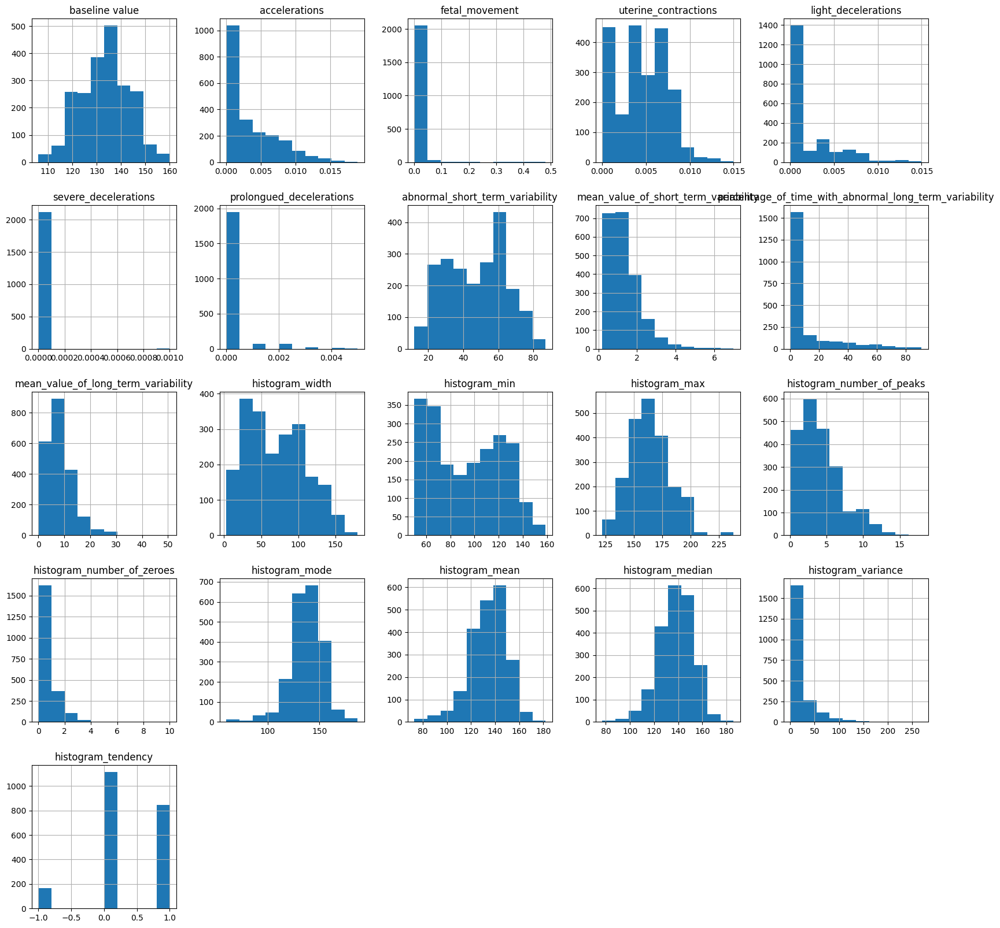

In [4]:
data.hist(figsize = (20,20))
plt.show()

As we can see and as anticipated by looking and at the most important statistic in the table above, the distribution are different between each other: part of the variables are **positive skewed** as the observations are concentrated on the left part of the graph, and those variables corresponds to variables with low mean and variance. The remaining variables seems to be **normally distributed**.

The boxplot usually allows for easy visualization of the most important descriptive statistics about numerical variables and the detection of outliers which can lead to overfitting:

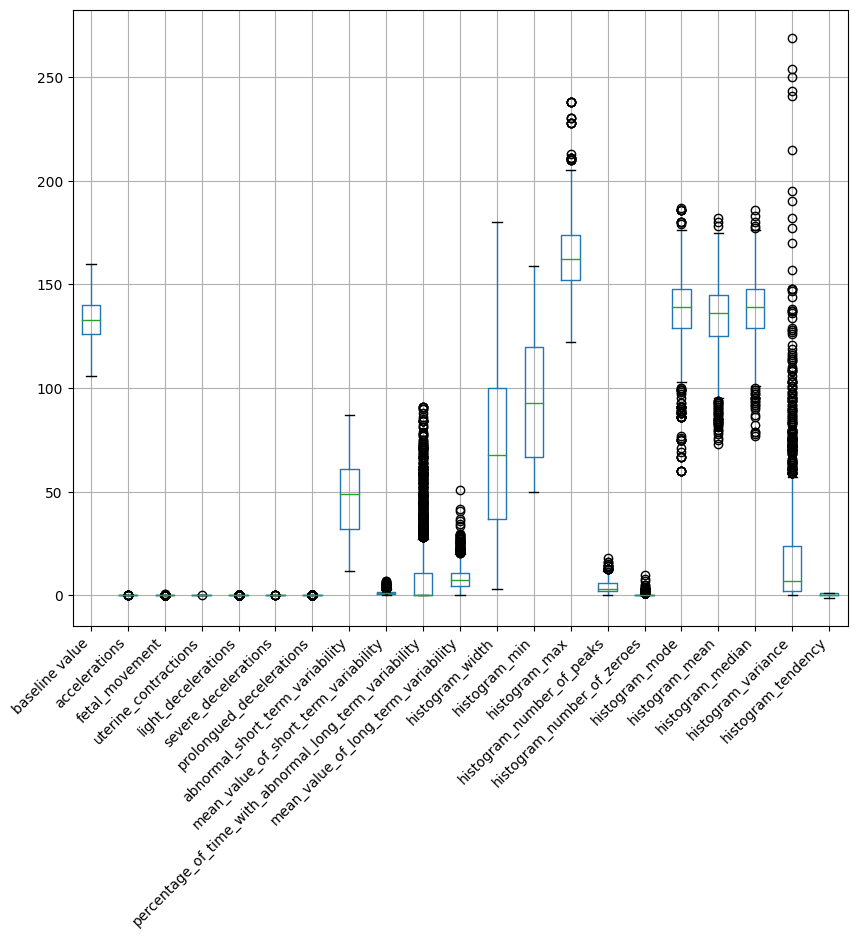

In [5]:
data.boxplot(figsize = (10,8))
plt.xticks(rotation=45, ha='right')
plt.show()

The *upper and lower lines* represent the maximum and minimum value of each feature, points upper the maximum line and lower the minimum line are considered outliers. \
The *amplitude* of the box represent the interquartile range, such as the difference between the 75% and the 25% of the observations. \
The *line inside the box* represents the mean value for each feature. \
From the boxplot is possible to detect some outliers distributed in almost all the features, however, assuming that those outliers are not consequences of human or measurements errors but represent some specific behaviour of the dataset, I decided to leave outliers **unhaltered**, in order to allow the algorithms to learn from some specific behaviour. 

The bar plot below represents the distribution of categorical variable:

<AxesSubplot:xlabel='fetal_health', ylabel='count'>

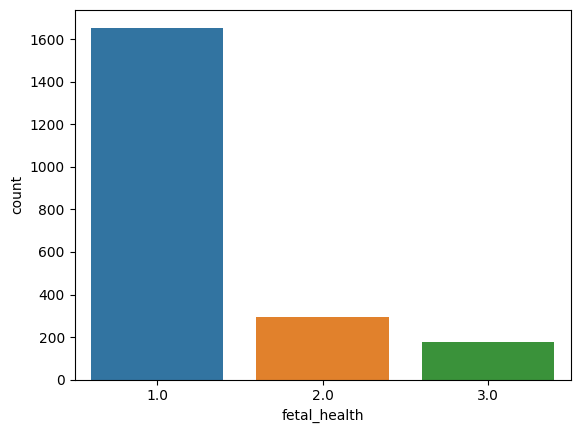

In [8]:
sns.countplot(x=data['fetal_health'])

The normal class contains about 1600 patients, the suspect class contains about 300 patients and the pathological class contains about 200 patients. This represents a common behaviour in real-life problems in this field of application, as usually the patients belonging to problematic classes are less than the other patients.
Clearly, this variable is completely **imbalanced**: the approach used later on for the data preprocessing will be an oversampling technique of the majority class called SMOTE in order to balance the classes for the supervised purpose.

### Multivariate Analysis
<a id="4"></a>

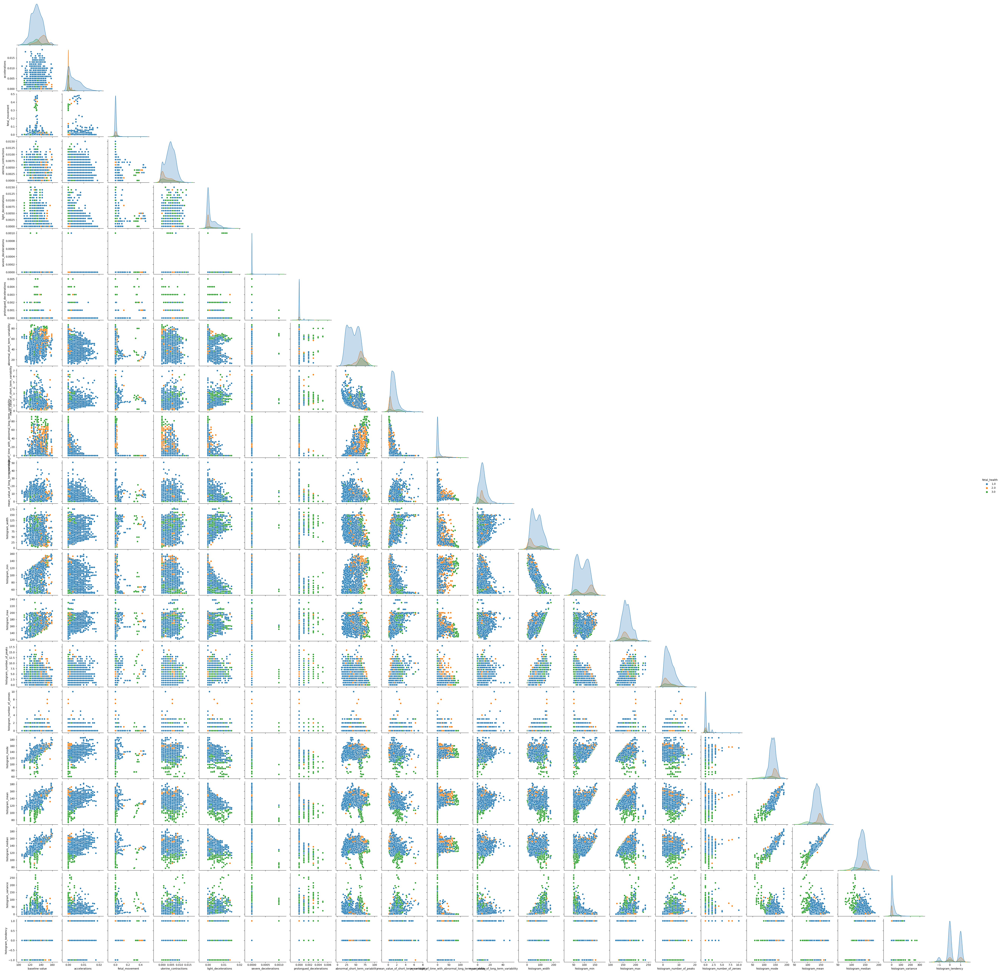

In [8]:
sns.pairplot(data, hue='fetal_health', diag_kind='kde', corner=True)

The scatter matrix allows us to understand how the observations are distributed in space. The different observations are represented as dots highlighted with three different colours that represent three different classes: *blue* for normal, *orange* for suspect and *green* for pathological. \
As we can see, in addition to the fact that the classes are unbalanced, the observations do not seem well separated in space, but some pairwise  variables seem to have a positive correlation. 

The correlation matrix is very useful to detect *multicollinearity* and pairwise correlation between predictors and response. \
The correlation has been implemented with the Pearson's coefficient and the matrix has been represented as a heatmap: colours near to red  correspond to higher positive correlation and vice-versa. 

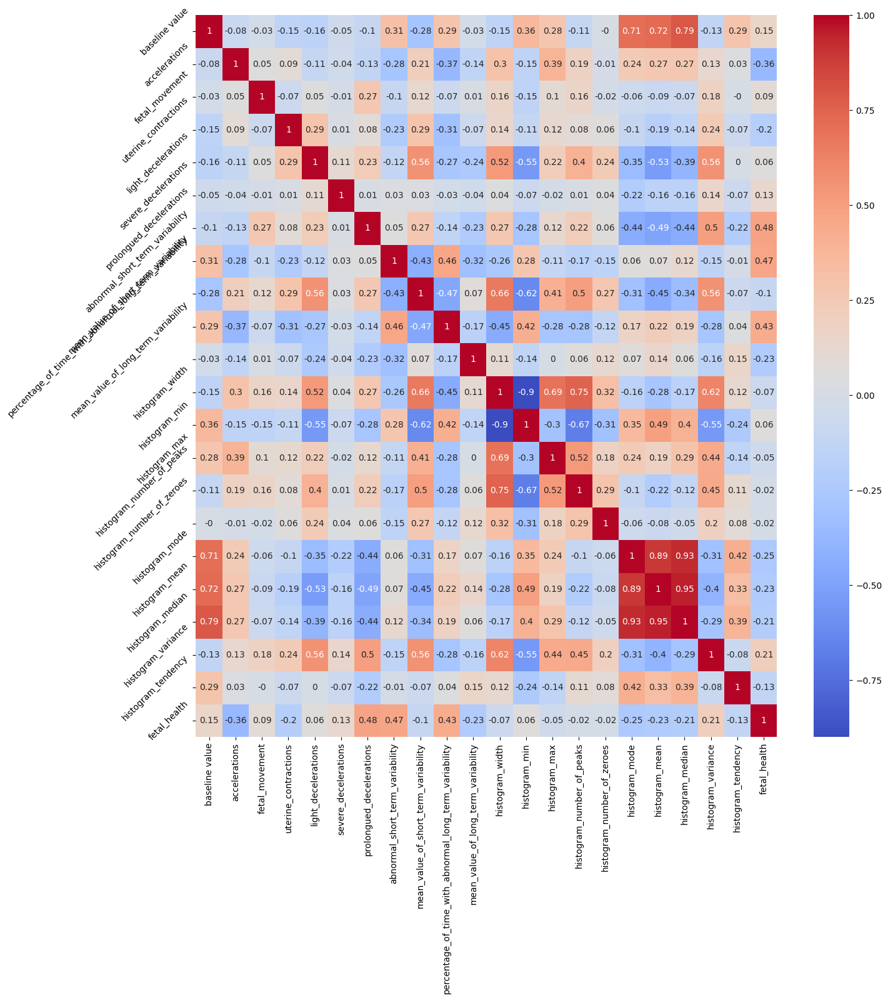

In [5]:
correlation_matrix = data.corr(numeric_only=False).round(2)
f, ax = plt.subplots(figsize=(15,15))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.yticks(rotation=45, ha='right')
plt.show()

From the correlation matrix showed above, it's possible to detect the **pairwise correlation between predictors and response**: From this last correlation matrix it's possible to detect "prolongued decelerations", "abnormal short term variability" and "% of time with abnormal long term variability" as good candidates to predict the fetal health status. \
In addition, some variables related to the histograms values seems to be very highly correlated between each other (multicollinearity). The phenomenon of **multicollinearity** usually doesn't represents a problem when applying non-linear and non-parametric algorithms. For this reason, I decided to left those variables unhaltered. 

### Data Preprocessing
<a id="5"></a>

The data preprocessing step is a very important procedure in real-life as in most of the cases, data provided to data scientists are not threated and need to be cleaned. \
The preprocessing step can include a lot of various techniques which allow data to be ready for the application of various algorithms and can vary also according to the different techniques to be applyied. \
For this purpose, the data preprocessing step regards four different techniques:
* Removing low-variance features
* Removing duplicate rows
* Balancing target variable
* Feature selection

#### Removing low-variance features

As mentioned above, low-variance features are less informative and can represent a problem for some algorithm. For this reason, I decided to drop those column which are 25% different from other features in term of variance:

In [4]:
round(np.var(data.iloc[:,:-1]),2)

baseline value                                              96.80
accelerations                                                0.00
fetal_movement                                               0.00
uterine_contractions                                         0.00
light_decelerations                                          0.00
severe_decelerations                                         0.00
prolongued_decelerations                                     0.00
abnormal_short_term_variability                            295.45
mean_value_of_short_term_variability                         0.78
percentage_of_time_with_abnormal_long_term_variability     338.29
mean_value_of_long_term_variability                         31.66
histogram_width                                           1516.83
histogram_min                                              873.40
histogram_max                                              321.84
histogram_number_of_peaks                                    8.69
histogram_

In [4]:
selector = VarianceThreshold(threshold=0.25)
selector.fit(data.iloc[:,:-1])
concol = [column for column in data.iloc[:,:-1].columns if column not in data.iloc[:,:-1].columns[selector.get_support()]]
for features in concol:
    print('Low variance features: ', features)

Low variance features:  accelerations
Low variance features:  fetal_movement
Low variance features:  uterine_contractions
Low variance features:  light_decelerations
Low variance features:  severe_decelerations
Low variance features:  prolongued_decelerations


In [5]:
data = data.drop(concol,axis=1)
data.shape

(2126, 16)

As we can see from the list above, the algorithm suggested to drop six columns from the original dataset, with a final number of features of 15 plus the target variable.

#### Removing duplicates

In [6]:
shape1 = data.shape[0]
data = data.drop_duplicates()
print('Removed', shape1 - data.shape[0], 'duplicate rows')

Removed 14 duplicate rows


The second step about data preprocessing is to remove duplicate rows in order to obtain a dataset with distinct observations: ***from this dataset, 14 duplicate rows has been detected and removed.***

#### Handling imbalanced target

The third step regards handling the imbalancing of the target class. For this purpose I decided to apply an oversampling technique on the minority class. \
The approach used for this purpose was the SMOTE: it stands for Synthetic Minority Oversampling Technique and it uses the KNN algorithm to create synthetic data from the original ones regarding the minority class until the imbalancing phenomenon is removed. The number of neighbors that the algorithms takes into consideration is equal to five and has been left as default value. \
***From the previous imbalanced dataset, 2826 rows has been added***

In [8]:
data['fetal_health'].value_counts()

1.0    1646
2.0     292
3.0     174
Name: fetal_health, dtype: int64

Added 2826 rows regarding minority classes


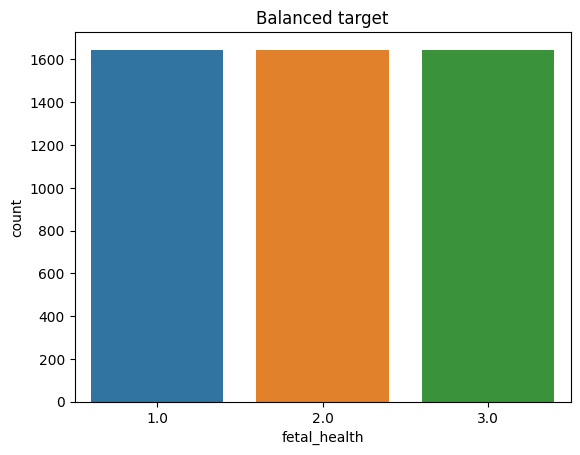

In [7]:
data1 = data.copy()
shape0 = data.shape[0]
smote = SMOTE(sampling_strategy = 'not majority', random_state=seed)
sm_data = smote.fit_resample(data1.iloc[:,:-1], data1.iloc[:,-1])
                                                             
smoted_data = sm_data[0]
smoted_data['fetal_health'] = sm_data[1]
                                                             
print('Added', smoted_data.shape[0] - shape0, 'rows regarding minority classes')
sns.countplot(x=smoted_data['fetal_health']).set(title='Balanced target')
plt.show()

#### Features selection

The final part of my data preprocessing step regards the selection of the most important features. There are a lot of techniques that allows me to detect the higher weighted features, from this methods I selected the **F-value of the ANOVA**. This method allows me to select the features which has the best variance according to the target variable. \
For this purpose, I decided to perform two features selection, the first is related to the **imbalanced dataset** and the second one is related to the **balanced dataset**: from now on, the supervised algorithms have been applyied on both dataset and will be compared at the end, in order to understand the impact of balancing target variable on the classification. 

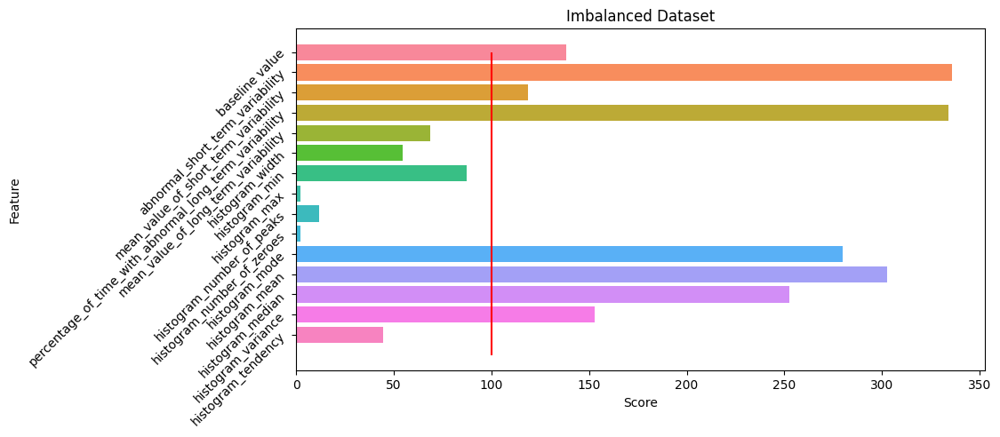

In [8]:
x = data.iloc[:,:-1] 
y = data.iloc[:,-1]

selector = SelectKBest(f_classif, k='all')
selector.fit(x,y)

dfscores = pd.DataFrame(selector.scores_)
dfcolumns = pd.DataFrame(x.columns)
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Feature','Score'] 

fig, ax=plt.subplots(figsize=(10,5))
sns.barplot(data=featureScores, x='Score', y='Feature',linewidth=0.5, saturation=2, orient='h').set(title = 'Imbalanced Dataset')
plt.vlines(x = 100, ymin = 0, ymax = 15, color = 'red')
plt.yticks(rotation=45)
plt.show()

According to this first plot, I will select those features which have an F-Score higher than 100, which is significantly higher than the other features. This will be my first final dataset regarding imbalanced target class. 

In [9]:
selection = featureScores[featureScores['Score']>=100] 
selection = list(selection['Feature']) 
selection.append('fetal_health') 

new_data1 = data[selection]

print('Imbalanced dataset: ', new_data1.shape)

Imbalanced dataset:  (2112, 9)


As we can see, the imbalanced dataset has 8 features and one target column and 2112 observations. \
To build the second balanced dataset to make the comparison during the analysis, I replyied the same procedure by considering the balanced dataset: 

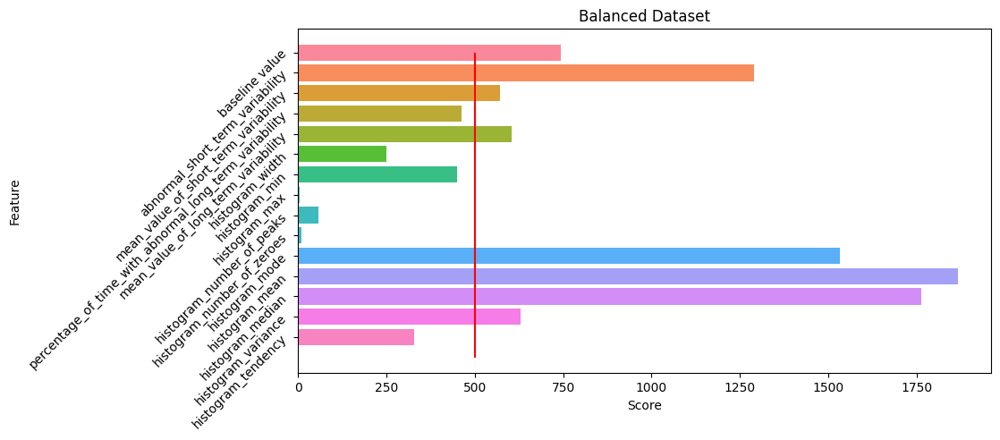

In [10]:
x = smoted_data.iloc[:,:-1] 
y = smoted_data.iloc[:,-1]

selector = SelectKBest(f_classif, k='all')
selector.fit(x,y)

dfscores = pd.DataFrame(selector.scores_)
dfcolumns = pd.DataFrame(x.columns)
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Feature','Score'] 

fig, ax=plt.subplots(figsize=(10,5))
sns.barplot(data=featureScores, x='Score', y='Feature',linewidth=0.5, saturation=2, orient='h').set(title = 'Balanced Dataset')
plt.vlines(x = 500, ymin = 0, ymax = 15, color = 'red')
plt.yticks(rotation=45)
plt.show()

As it possible to notice in this second plot, the F-values are much more higher than the first one. From this behaviour, I can assume that the balanced dataset will provides me better performance in terms of classification. \
From this dataset I selected all the features which have an F-value higher than 500, which is considerably different from the other features. 

In [11]:
#Selection method
selection = featureScores[featureScores['Score']>=500] 
selection = list(selection['Feature']) 
selection.append('fetal_health') 

new_data2 = smoted_data[selection]

print('Balanced dataset: ', new_data2.shape)

Balanced dataset:  (4938, 9)


Finally, the second balanced dataset will have 8 features and one target column and 4938 observations, included synthetic observations automatically generated from the SMOTE algorithm. 

#### Final Overview

The pairplots and boxplots below shows the results of the data preprocessing on both imbalanced and balanced dataset.

##### Imbalanced data

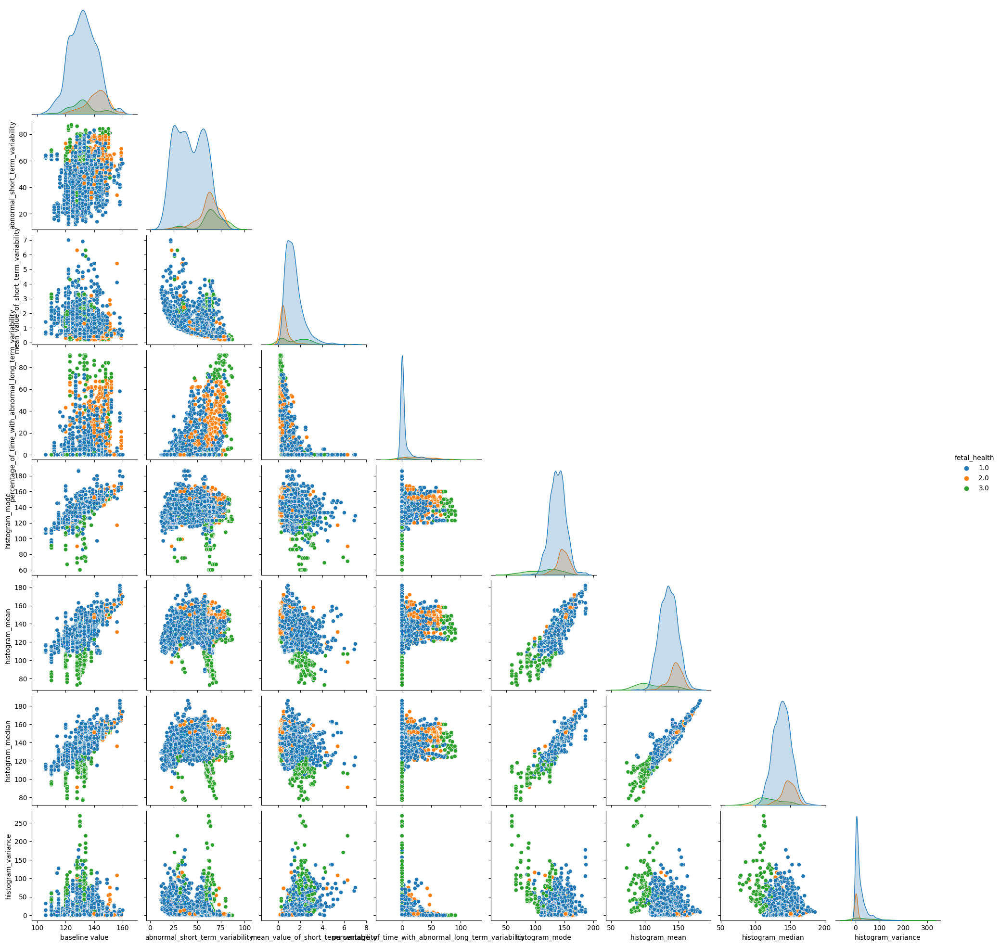

In [17]:
sns.pairplot(new_data1, hue='fetal_health', diag_kind='kde', corner=True)

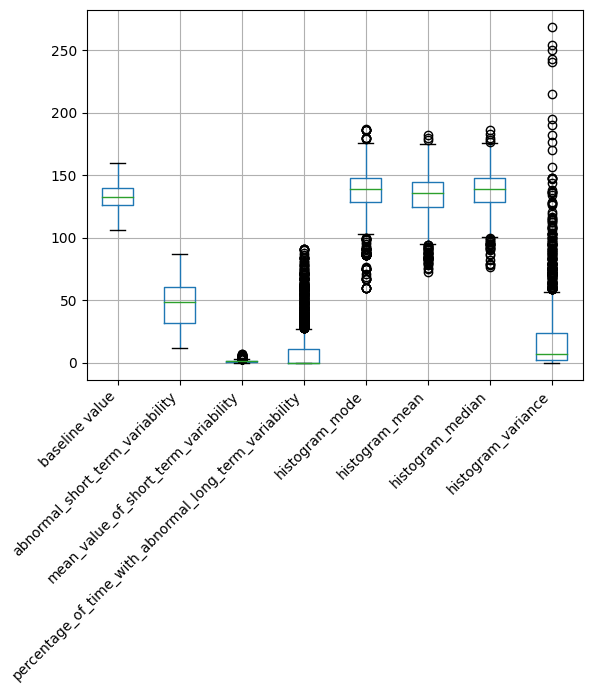

In [19]:
new_data1.boxplot()
plt.xticks(rotation=45, ha='right')
plt.show()

##### Balanced data

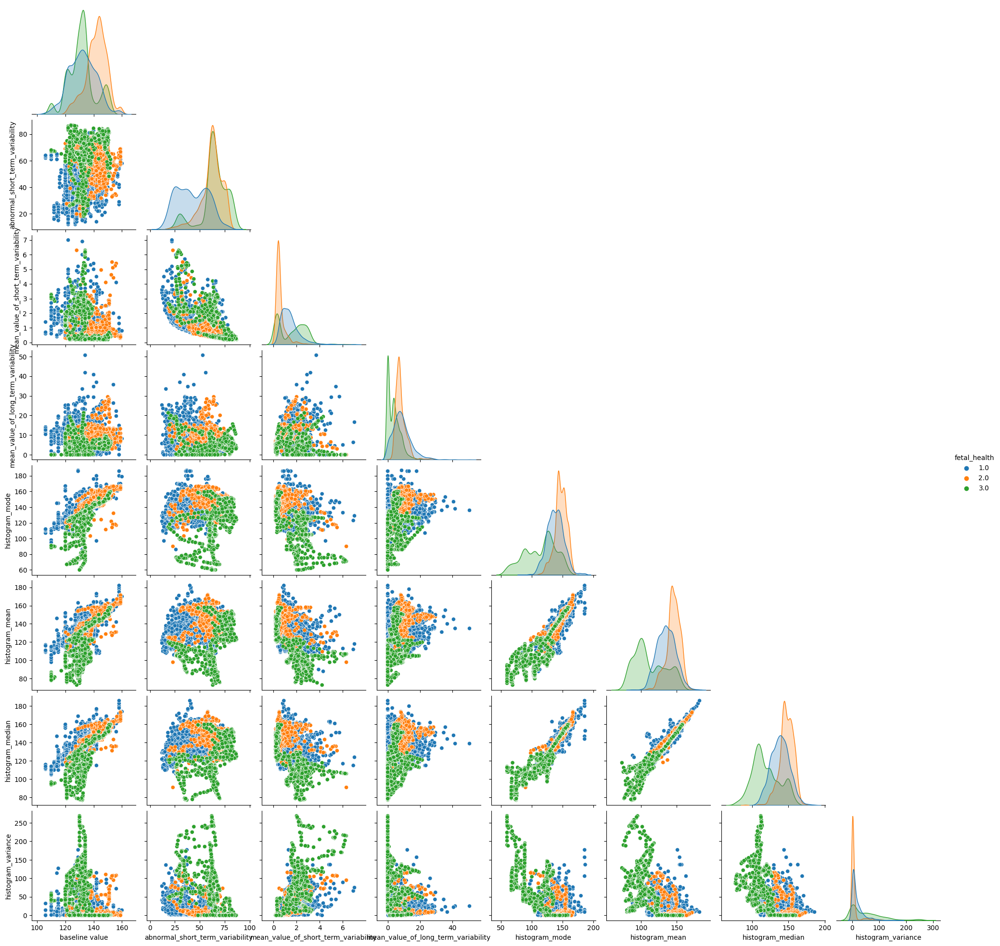

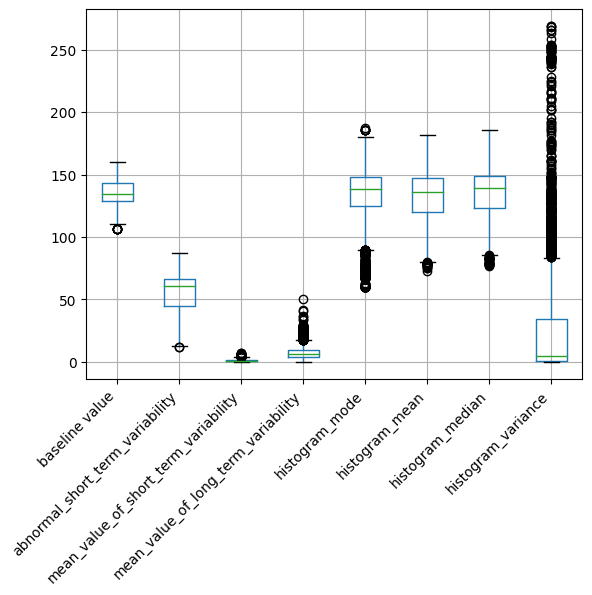

In [20]:
sns.pairplot(new_data2, hue='fetal_health', diag_kind='kde', corner=True)
plt.show()
new_data2.boxplot()
plt.xticks(rotation=45, ha='right')
plt.show()

From the plots above we can see that on both dataset histogram variance has a higher number of outliers compared to the other selected features and baseline value and abnormal short term variability are the predictors with less number of outliers. In addition, from the diagonal of the pairplots it's possible to notice that the balanced dataset is more interpretable but the classes are not linearly separable: pathological fetal health status refers to lower histogram median, mean, mode and mean value of long term variability and higher values of short term variability.

***
## Supervised Machine Learning
<a id="6"></a>

Machine learning algorithms are divided into supervised and unsupervised, in addition to semi-supervised and reinforcement learning. \
***Supervised machine learning*** allows to train different types of algorithms that can learn the general behaviour of the predictors to provide the response variable. If the response is a continuous variable, regression technique should be provided, instead, for categorical response variable classification technique must be used (binary if the response variable provides two classes, multi-classification for more than two labels). \
There are multiple metrics to evaluate the goodness of fit of the algorithms: for the regression purposes the most common metric is the *MSE* which gives mean squared value of the difference between ground truth and predicted labels, usually called *error*; for the binary classification problem the *binary-crossentropy* allows to percentage of matched and mismatched labels (accuracy and loss) and the *AUC* provides a value which corresponds to the true predicted labels over the whole labels; for multi-classification problem the *crossentropy* can be used in order to check all the matched values referred to any classes, the classification report function provided by Scikit allows to print the most relevant metrics (like precision, recall, F1 score) for each classes. \
***In this report, the mean accuracy from the K-Fold cross-validation, with k = 5, has been used to evaluate each algorithm, this means that the algorithm is repeated iteratively by taking into consideration a group of 5 observations each time as validation dataset; the final accuracy score will be the mean value of all the accuracy obtained. Then, a Grid Search has been applyied as hyperparameter optimization: Grid Search allows to search throw each combination of hyperparameter in order to find the best model according to the defined score. Also in this case, the algorithm performs a K-Fold Cross Validation on each try.***

### Train and test splitting
<a id="8"></a>

For this purpose, both balanced and imbalanced datasets have been splitted into train and test set: the train set contains 80% of the observations of the original dataset and the remaining 20% composed the test set. \
In addition, the validation set has not been produced because the evaluation metrics token into consideration in the following parts is the k-fold cross validation: during the evaluation, the train set is splitted iteratively into k=5 dimentional validation set and the final accuracy score will be the mean value of the k-fold accuracy score.

In [21]:
x_train1, x_test1, y_train1, y_test1 = train_test_split(new_data1.iloc[:,:-1], new_data1.iloc[:,-1], test_size=0.2, random_state=seed, shuffle = True)
print('Imbalanced Train set dimention: ', x_train1.shape)
print('Imbalanced Test set dimention: ', x_test1.shape)

Imbalanced Train set dimention:  (1689, 8)
Imbalanced Test set dimention:  (423, 8)


In [22]:
sc1=StandardScaler()
x_train1= sc1.fit_transform(x_train1) 
x_test1= sc1.transform(x_test1)

As we can see, the imbalanced dataset was splitted to obtain 1689 observations in the train set and 423 observations in the test set. Then, the data has been scaled to give to each variables the same importance. 

In [23]:
x_train2, x_test2, y_train2, y_test2 = train_test_split(new_data2.iloc[:,:-1], new_data2.iloc[:,-1], test_size=0.2, random_state=seed, shuffle = True)
print('Balanced Train set dimention: ', x_train2.shape)
print('Balanced Test set dimention: ', x_test2.shape)

Balanced Train set dimention:  (3950, 8)
Balanced Test set dimention:  (988, 8)


In [24]:
sc2=StandardScaler()
x_train2= sc2.fit_transform(x_train2) 
x_test2= sc2.transform(x_test2) 

The second balanced dataset was splitted to obtain 3950 observations in the train set and 988 observations in the test set. Then, also in this case the data was scaled to allow features to have the same behaviour. 

### Linear models
<a id="9"></a>

Linear models refer to those algorithm that allows to detect a linear decision boundary that separate each classes. \
This analysis contains linear support vector machines as a linear algorithm.

#### Support Vector Machine
<a id="10"></a>

Support vector machines are also defined as discriminative models. The main logic of the support vector machines is the margin based approach where a line or curve in the hyperplane separe each classes: to obtain good results, the data should be as far as possible from the margin of the curve, also called support vectors. \
Initially, the selected kernel is a linear separation between classes and the regularization parameter has been set as 0.2, which correspond to the fraction of margin error on the upper and lower bound of the kernel. 

In [19]:
svc1 = SVC(kernel='linear', random_state=seed)
svc1.fit(x_train1, y_train1)
print('Accuracy score on imbalanced dataset is: ', (cross_val_score(svc1, x_train1, y_train1, cv=k)).mean()*100)
svc2 = SVC(kernel='linear', random_state=seed)
svc2.fit(x_train2, y_train2)
print('Accuracy score on balanced dataset is: ', (cross_val_score(svc2, x_train2, y_train2, cv=k)).mean()*100)

Accuracy score on imbalanced dataset is:  87.92232191456112
Accuracy score on balanced dataset is:  83.67088607594937


As we can see, the Linear SVC with default parameters performes better for the imbalanced dataset. The procedure below allows to define a list of parameters that will be tryied in order to boost the accuracy and the performance of each model. 

In [20]:
parameters = {'C': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]}
opt_svc1 = GridSearchCV(SVC(kernel = 'linear', random_state=seed), 
                       parameters,
                       cv=5,
                       verbose=0,
                       scoring='accuracy')

svc1 = opt_svc1.fit(x_train1, y_train1)
print('Best parameters for imbalanced dataset: ', svc1.best_params_, 'with cross validation score: ', (svc1.best_score_)*100)
svc1_score = svc1.best_score_

opt_svc2 = GridSearchCV(SVC(kernel = 'linear', random_state=seed), 
                       parameters,
                       cv=5,
                       verbose=0,
                       scoring='accuracy')

svc2 = opt_svc2.fit(x_train2, y_train2)
print('Best parameters for balanced dataset: ', svc2.best_params_, 'with cross validation score: ', (svc2.best_score_)*100)
svc2_score = svc2.best_score_

Best parameters for imbalanced dataset:  {'C': 0.2} with cross validation score:  88.27717591698419
Best parameters for balanced dataset:  {'C': 1} with cross validation score:  83.67088607594937


As we can see, after the GridSearch, accuracy increased of +0.3%, for the imbalanced dataset and the regularization parameter corresponds to 20% and for the balanced dataset it corresponds to the 10%. 

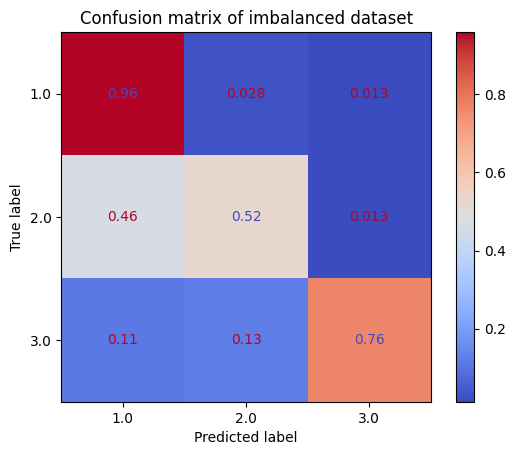

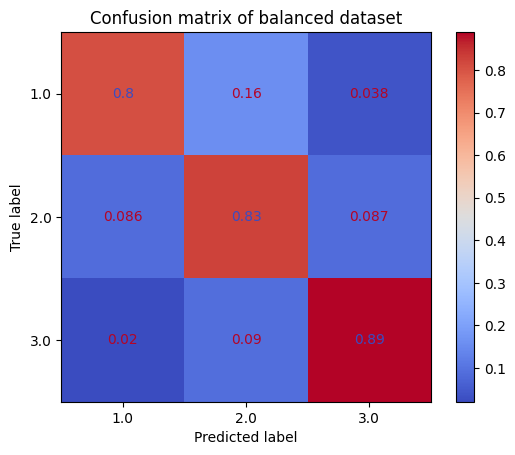

In [21]:
ConfusionMatrixDisplay.from_estimator(svc1, x_train1, y_train1, cmap='coolwarm', normalize='true')
plt.title('Confusion matrix of imbalanced dataset')
plt.show()
ConfusionMatrixDisplay.from_estimator(svc2, x_train2, y_train2, cmap='coolwarm', normalize='true')
plt.title('Confusion matrix of balanced dataset')
plt.show()

Thanks to the confusion matrices, I can detect that the algorithm performed an higher accuracy in the imbalanced dataset that is related to the "normal" class only, in fact, the misclassified observations regarding "suspect" and "pathological" classes was higher than the algorithm applyied on the balanced dataset. In this last case, the accuracy rate is higher regarding the "pathological" class and the misclassified observations was lower. For this reason, I can confirm that the general behaviour of this algorithm on the balanced dataset is less risky than in the imbalanced dataset. 

### Non-parametric models
<a id="11"></a>

Non-parametric algorithms are usually considered more interpretable than the parametric models: they allows to compute the decision boundary according to logics that don't concern a parametric function. \
For this purpose, KNN and decision tree have been considered. 

#### K-Nearest Neighbors
<a id="12"></a>

K-Nearest neighbors, as the name suggests, allows to classify each observations according to the majority of the k nearest observations. \
In this analysis, k=5 has been considered, so each observations is classifyied according to the classification of the five nearest observations. 

In [22]:
knn1 = KNeighborsClassifier()
knn1.fit(x_train1, y_train1)
print('Accuracy score on imbalanced dataset is: ', (cross_val_score(knn1, x_train1, y_train1, cv=k)).mean()*100)
knn2 = KNeighborsClassifier()
knn2.fit(x_train2, y_train2)
print('Accuracy score on balanced dataset is: ', (cross_val_score(knn2, x_train2, y_train2, cv=k)).mean()*100)

Accuracy score on imbalanced dataset is:  90.58644847505836
Accuracy score on balanced dataset is:  92.43037974683543


In this second case, the algorithm performs better for the balanced dataset with an accuracy rate of 92% rather than the imbalanced dataset, with an accuracy rate of 90%.

In [23]:
parameters = {'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]}

opt_knn1 = GridSearchCV(KNeighborsClassifier(), 
                       parameters,
                       cv=k,
                       verbose=0,
                       scoring='accuracy')

knn1 = opt_knn1.fit(x_train1, y_train1)
print('Best parameters for imbalanced dataset: ', knn1.best_params_, 'with cross validation score: ', (knn1.best_score_)*100)
knn1_score = knn1.best_score_

opt_knn2 = GridSearchCV(KNeighborsClassifier(), 
                       parameters,
                       cv=k,
                       verbose=0,
                       scoring='accuracy')

knn2 = opt_knn2.fit(x_train2, y_train2)
print('Best parameters for balanced dataset: ', knn2.best_params_, 'with cross validation score: ', (knn2.best_score_)*100)
knn2_score = knn2.best_score_

Best parameters for imbalanced dataset:  {'n_neighbors': 2} with cross validation score:  91.5335452039401
Best parameters for balanced dataset:  {'n_neighbors': 1} with cross validation score:  95.21518987341773


After empowered the algorithm by fitting it with the best parameters, there are an increasing of +3% on the imbalanced dataset and an increasing of +1% on the balanced dataset, with k equal 2 and equal 1.

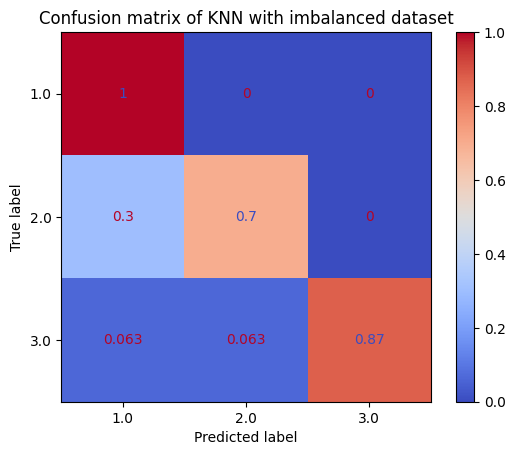

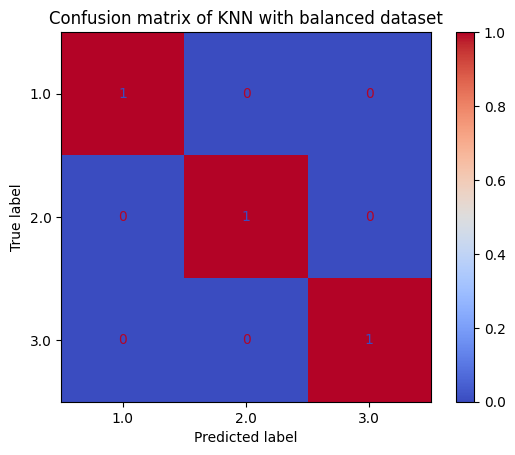

In [24]:
ConfusionMatrixDisplay.from_estimator(knn1, x_train1, y_train1, cmap='coolwarm', normalize='true')
plt.title('Confusion matrix of KNN with imbalanced dataset')
plt.show()

ConfusionMatrixDisplay.from_estimator(knn2, x_train2, y_train2, cmap='coolwarm', normalize='true')
plt.title('Confusion matrix of KNN with balanced dataset')
plt.show()

From the confucion matrices of the KNN algorithm, I can detect that the algorithm produced a lot of risky misclassified observations in the imbalanced dataset.

#### Decision tree
<a id="13"></a>

Decision tree is considered as the most interpretable algorithm, in fact, it's also possible to implement a very clear and understandable visualization of the algorithm. \
The decision tree below should be read from the top to the bottom according to the splitting criterion: each leaf shows the gini index as measure of purity and the probability of each classes. 

In [25]:
dt1 = DecisionTreeClassifier(random_state=seed)
dt1.fit(x_train1, y_train1)
print('Accuracy score on imbalanced dataset is: ', (cross_val_score(dt1, x_train1, y_train1, cv=k)).mean()*100)
dt2 = DecisionTreeClassifier(random_state=seed)
dt2.fit(x_train2, y_train2)
print('Accuracy score on balanced dataset is: ', (cross_val_score(dt2, x_train2, y_train2, cv=k)).mean()*100)

Accuracy score on imbalanced dataset is:  90.52675012729794
Accuracy score on balanced dataset is:  91.79746835443036


From the accuracy score I can detect that decision tree performed worse than the KNN as non-parametric model and better than the linear model. The code below allows me to perform a Grid Search as hyperparameter tuning in order to obtain the optimal depth of the tree, such as the tree pruning, that allows to avoid overfitting. 

In [26]:
parameters = {'max_depth': [2, 4, 8, 16, 36, 64, 128, 256]}

opt_dt1 = GridSearchCV(DecisionTreeClassifier(random_state=seed), 
                       parameters,
                       cv=k,
                       verbose=0,
                       scoring='accuracy')

dt1 = opt_dt1.fit(x_train1, y_train1)
print('Best parameters for imbalanced dataset: ', dt1.best_params_, 'with cross validation score: ', (dt1.best_score_)*100)
dt1_score = dt1.best_score_

opt_dt2 = GridSearchCV(DecisionTreeClassifier(random_state=seed), 
                       parameters,
                       cv=k,
                       verbose=0,
                       scoring='accuracy')

dt2 = opt_dt2.fit(x_train2, y_train2)
print('Best parameters for balanced dataset: ', dt2.best_params_, 'with cross validation score: ', (dt2.best_score_)*100)
dt2_score = dt2.best_score_

Best parameters for imbalanced dataset:  {'max_depth': 8} with cross validation score:  92.24430670904079
Best parameters for balanced dataset:  {'max_depth': 36} with cross validation score:  91.79746835443036


The default model hasn't got any maximum depth, this means that the resulting tree is not pruned. The imbalanced dataset, after the pruning, performed an increasing in terms of accuracy of +2% and the resulting tree has a maximum depth of 98splitting. The balanced dataset hasn't performed an increasing in terms of accuracy, but, by defininf a maximum depth of the tree and pruning it to 36 maximum depth of splitting, I am able to avoid overfitting. 

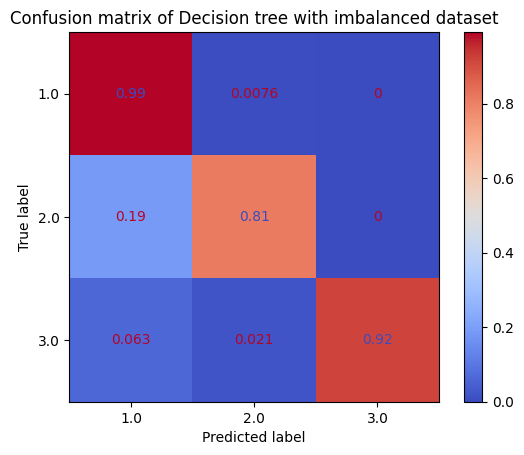

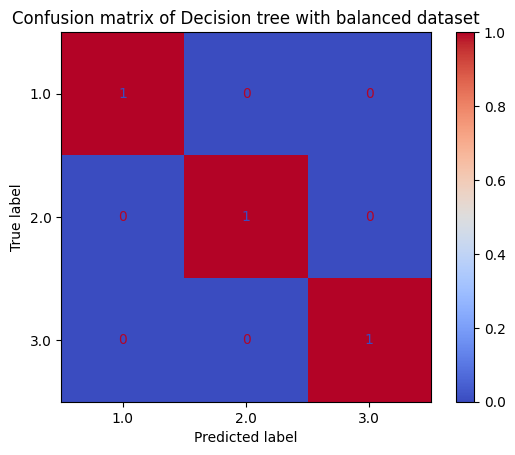

In [27]:
ConfusionMatrixDisplay.from_estimator(dt1, x_train1, y_train1, cmap='coolwarm', normalize='true')
plt.title('Confusion matrix of Decision tree with imbalanced dataset')
plt.show()

ConfusionMatrixDisplay.from_estimator(dt2, x_train2, y_train2, cmap='coolwarm', normalize='true')
plt.title('Confusion matrix of Decision tree with balanced dataset')
plt.show()

As we can see from the confusion matrices, also in this case the algorithm performed a lot of risky misclassifyied observations on the imbalanced dataset.

### Ensemble models
<a id="14"></a>

One of the main problems regarding non-parametric models, and in particular the decision tree, is the randomness and the increasing variance and bias difference between each trial. Ensemble models performes different models and this behaviour is able to increase the bias-variance tradeoff. \
In particular, bagging ensemble models performs a series of models in parallel and the resulting score will be the mean of all the results. This allows to reduce the bias of the models, boosting models performes different models in sequence and this method allows the model to learn from previous error by reducing the variance. 

#### Bagging

##### Random Forest
<a id="15"></a>

Random forest allows us to avoid the difference in terms of bias given by the random behaviour of it. In this case, a set of multiple decision tree will be considered in parallel and the final decision will be the average value of all the results. 

In [28]:
rf1 = RandomForestClassifier(random_state=seed)
rf1.fit(x_train1, y_train1)
print('Accuracy score on imbalanced dataset is: ', (cross_val_score(rf1, x_train1, y_train1, cv=k)).mean()*100)
rf2 = RandomForestClassifier(random_state=seed)
rf2.fit(x_train2, y_train2)
print('Accuracy score on balanced dataset is: ', (cross_val_score(rf2, x_train2, y_train2, cv=k)).mean()*100)

Accuracy score on imbalanced dataset is:  93.31044896669184
Accuracy score on balanced dataset is:  95.0126582278481


According to the results above, random forest performed better on the balanced dataset, with an accuracy rate of 95% on the balanced dataset and 93.3% on the imbalanced dataset. \
The code below allows to perform a Grid Search by pruning each tree and deciding the number of trees to use to perform the prediction. 

In [29]:
parameters = {'n_estimators': [64, 128, 256, 512],
              'max_depth' : [2, 4, 8, 16, 36, 64, 128, 256, 512]}

opt_rf1 = GridSearchCV(RandomForestClassifier(random_state=seed), 
                       parameters,
                       cv=k,
                       verbose=0,
                       scoring='accuracy')

rf1 = opt_rf1.fit(x_train1, y_train1)
print('Best parameters for imbalanced dataset: ', rf1.best_params_, 'with cross validation score: ', (rf1.best_score_)*100)
rf1_score = rf1.best_score_

opt_rf2 = GridSearchCV(RandomForestClassifier(random_state=seed), 
                       parameters,
                       cv=k,
                       verbose=0,
                       scoring='accuracy')

rf2 = opt_rf2.fit(x_train2, y_train2)
print('Best parameters for balanced dataset: ', rf2.best_params_, 'with cross validation score: ', (rf2.best_score_)*100)
rf2_score = rf2.best_score_

Best parameters for imbalanced dataset:  {'max_depth': 16, 'n_estimators': 64} with cross validation score:  93.66547855249065
Best parameters for balanced dataset:  {'max_depth': 36, 'n_estimators': 256} with cross validation score:  95.24050632911394


According to this algorithm, I can detect an increasing in terms of accuracy of 0.3% on the imbalanced dataset, with 64 decision trees with a maximum depth of 16 split for each tree; the balanced dataset performed an increasing of 0.2% with more decision trees and 36 maximum depth for each tree.

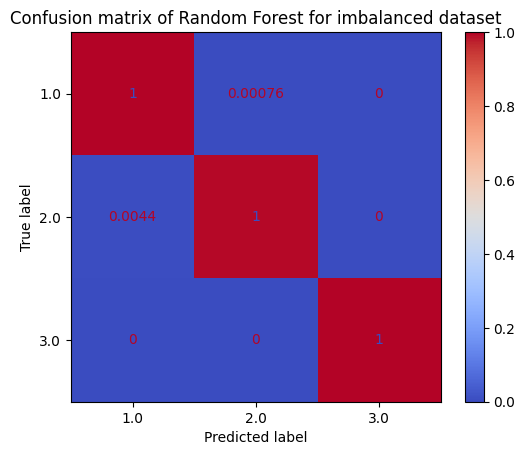

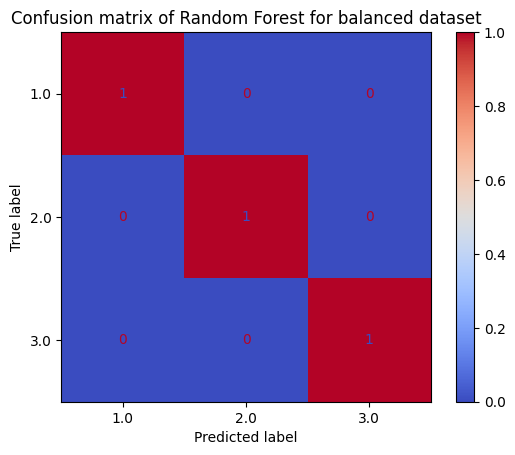

In [31]:
ConfusionMatrixDisplay.from_estimator(rf1, x_train1, y_train1, cmap='coolwarm', normalize='true')
plt.title('Confusion matrix of Random Forest for imbalanced dataset')
plt.show()

ConfusionMatrixDisplay.from_estimator(rf2, x_train2, y_train2, cmap='coolwarm', normalize='true')
plt.title('Confusion matrix of Random Forest for balanced dataset')
plt.show()

Also in this case, thanks to the confusion matrices I am able to identify less misclassified observations on the balanced dataset rather than in the imbalanced dataset.

#### Boosting

##### Gradient Boosting
<a id="16"></a>

The boosting represent ensemble method as they contain multiple algorithm performed together in series in order to avoid the bias problem in bagging models. In detail, the boosting algorithms are performed in series, this means that each subsequent model learns from the previous error until convergence and the final model will be the model by which the error rate stop to decrease. 

In [32]:
gbc1 = GradientBoostingClassifier(random_state=seed)
gbc1.fit(x_train1, y_train1)
print('Accuracy score on imbalanced dataset is: ', (cross_val_score(gbc1, x_train1, y_train1, cv=k)).mean()*100)
gbc2 = GradientBoostingClassifier(random_state=seed)
gbc2.fit(x_train2, y_train2)
print('Accuracy score on balanced dataset is: ', (cross_val_score(gbc2, x_train2, y_train2, cv=k)).mean()*100)

Accuracy score on imbalanced dataset is:  92.89519428300528
Accuracy score on balanced dataset is:  93.0632911392405


Gradient Boosting performed slightly better on the balanced dataset, with an accuracy of 93%. \
The Grid Search allows me to define the optimal number of estimators and the learning rate used during the gradient step, that allows the model to backpropagate in order to reduce the error.

In [33]:
parameters = {'n_estimators': [64, 128, 256],
              'learning_rate' : [0.1, 0.001, 0.2, 0.002]}

opt_gb1 = GridSearchCV(GradientBoostingClassifier(random_state=seed), 
                       parameters,
                       cv=k,
                       verbose=0,
                       scoring='accuracy')

gb1 = opt_gb1.fit(x_train1, y_train1)
print('Best parameters for imbalanced dataset: ', gb1.best_params_, 'with cross validation score: ', (gb1.best_score_)*100)
gb1_score = gb1.best_score_

opt_gb2 = GridSearchCV(GradientBoostingClassifier(random_state=seed), 
                       parameters,
                       cv=k,
                       verbose=0,
                       scoring='accuracy')

gb2 = opt_gb2.fit(x_train2, y_train2)
print('Best parameters for balanced dataset: ', gb2.best_params_, 'with cross validation score: ', (gb2.best_score_)*100)
gb2_score = gb2.best_score_

Best parameters for imbalanced dataset:  {'learning_rate': 0.1, 'n_estimators': 128} with cross validation score:  93.19157902129825
Best parameters for balanced dataset:  {'learning_rate': 0.2, 'n_estimators': 256} with cross validation score:  95.06329113924052


The optimization process allows me to increase the accuracy on the imbalanced dataset of +0.1%, with 128 estimators and a learning rate of 0.1; on the balanced dataset the increasing was very low and with more estimators than the algorithm of the imbalanced dataset.

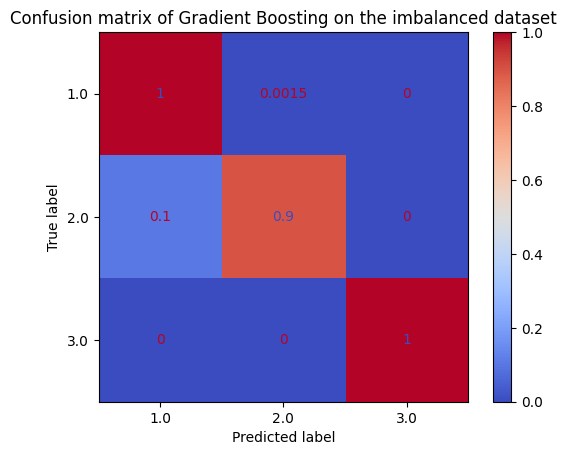

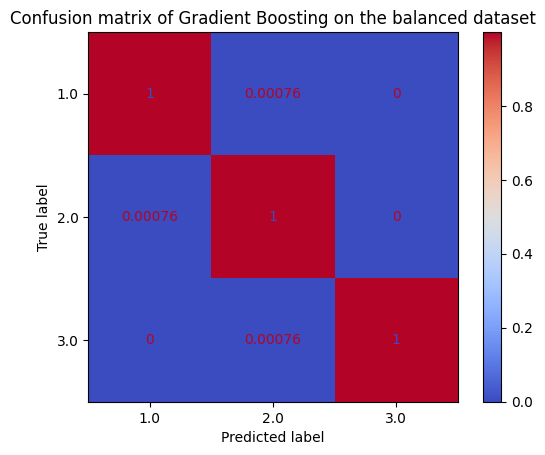

In [65]:
ConfusionMatrixDisplay.from_estimator(gb1, x_train1, y_train1, cmap='coolwarm', normalize='true')
plt.title('Confusion matrix of Gradient Boosting on the imbalanced dataset')
plt.show()

ConfusionMatrixDisplay.from_estimator(gb2, x_train2, y_train2, cmap='coolwarm', normalize='true')
plt.title('Confusion matrix of Gradient Boosting on the balanced dataset')
plt.show()

Also in this case, there are more misclassified observations on the imbalanced dataset rather than in the balanced dataset. 

### Model Selection
<a id="17"></a>

As the dataset has more than two variables, a visualization analysis for the model selection has been excluded. Indeed, the accuracy scores of the optimized models of both balanced and imbalanced dataset has been compared in the final plot below:

In [34]:
accuracy1 = [svc1_score, dt1_score, knn1_score, rf1_score, gb1_score]
accuracy2 = [svc2_score, dt2_score, knn2_score, rf2_score, gb2_score]
models = ['Linear SVC', 'Decision Tree', 'KNN', 'Random Forest', 'Gradient Boosting']

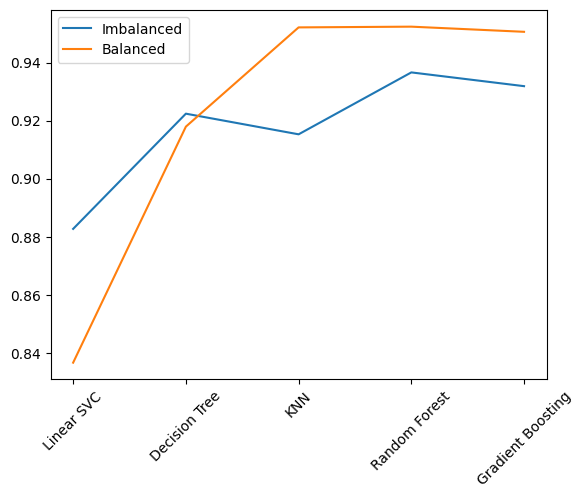

In [35]:
fig, ax = plt.subplots()
ax.plot(models, accuracy1, label = 'Imbalanced')
ax.plot(models, accuracy2, label = 'Balanced')
ax.legend()
plt.xticks(rotation=45)
plt.show()

As we can see from the plot, in general, almost all the algorithms performed better ion the balanced dataset. For this reason, I can assume that balanced dataset allows algorithms to learn better than imbalanced dataset, with a consistent increasing in terms of accuracy. \
In particular, **K-Nearest Neighbors in the balanced dataset** was identifyied as the best model among the overall algorithms. 

### Testing
<a id="19"></a>

The test dataset is always used by spplying the final and optimal model and never for training. \
In this section I applyied the KNN model trained with the balanced dataset in the balanced test set:

In [36]:
predictions = knn2.predict(x_test2)

In [37]:
print('Table of metrics:\n ', classification_report(y_test2, predictions, target_names=['Normal', 'Suspect', 'Pathological']))

Table of metrics:
                precision    recall  f1-score   support

      Normal       0.97      0.92      0.95       331
     Suspect       0.90      0.96      0.93       329
Pathological       0.98      0.96      0.97       328

    accuracy                           0.95       988
   macro avg       0.95      0.95      0.95       988
weighted avg       0.95      0.95      0.95       988



The classification report is an important tool that allows to represent a set of important metrics: as we can see, the optimal model performed **95%** of accuracy, which is very similar to the accuracy score on the train set and this let me exclude an overfitting. \
In addition, the F1-score allows me to identify that the "pathological" class contributed the most to gain that accuracy score, which is a very important behaviour in this field of application as this is the most important and risky class.

The confusion matrix below let me confirm that there are very low amount of misclassified observations.

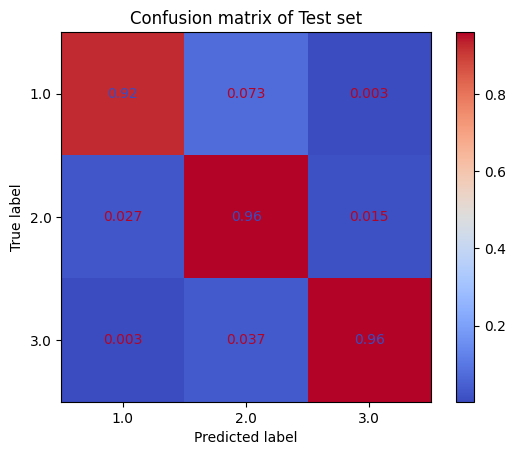

In [38]:
ConfusionMatrixDisplay.from_predictions(y_test2, predictions, cmap='coolwarm', normalize='true')
plt.title('Confusion matrix of Test set')
plt.show()

***
## Unsupervised learning
<a id="20"></a>

Unsupervised Machine Learning algorithms allow us to understand important behaviour of the unlabeled data. \
In this report, unsupervised algorithms coming from the Scikit Learn library have been used: 
* in the first section, a dimensionality reduction technique has been performed to represent the data in a lower-dimensional space by maintaining the highest variance explained; 
* in the second section, different clustering algorithms have been performed on the PCA dataset to understand which one can better understand the clustering behavior of the observations, finally the results has been compared with the ground truth because of lack of domain knowledge.

### Dimentionality reduction
<a id="21"></a>

The Principal Component Analysis is a dimensionality reduction technique that allows the production of a summary of the information contained in the dataset and finding the best representation of a lower-dimensional space. It takes into account numerical and continuous variables only.

In addition, because of the different scales of measures and different mean and variance between features, the dataset has been standardised with the z-score method to extract a new set of data that have 0 mean and standard deviation equal to 1.

The PCA function from the Scikit Learn library has been applied to the standardized dataset by extracting the principal components. The variance and loadings of the Principal Components are computed by applying an eigendecomposition on the covariance matrix of the scaled dataset:
* the eigenvectors represent the loadings, such as the weight of each variable according to the Principal Component. 
* by multiplying the eigenvector by the original dataset it’s possible to detect the score which corresponds to the representation of each observation on the new dimensional space. 

In [12]:
x = data.iloc[:,:-1]
y = data.iloc[:,-1]

In [13]:
sc = StandardScaler()
df = pd.DataFrame(sc.fit_transform(x), columns = x.columns)
df.head()

,baseline value,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,mean_value_of_long_term_variability,histogram_width,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency
0,-1.352582,1.516071,-0.945178,1.819796,-1.024411,-0.168446,-1.067703,-2.123673,-0.704394,-0.460282,-1.063942,0.154236,-1.180095,1.862656,1.115066
1,-0.131920,-1.746638,0.864730,-0.534329,0.396119,1.524660,-0.864585,1.888979,0.651123,0.952676,0.216565,0.090163,0.132401,-0.238195,-0.521501
2,-0.030199,-1.804901,0.864730,-0.534329,0.928818,1.524660,-0.864585,1.888979,0.312244,0.952676,0.216565,0.026090,-0.005757,-0.203755,-0.521501
3,0.071523,-1.804901,1.204088,-0.534329,2.633454,1.191169,-1.372381,0.328503,2.345519,-0.460282,-0.027341,-0.037982,-0.074835,-0.203755,1.115066
4,-0.131920,-1.804901,1.204088,-0.534329,2.082998,1.191169,-1.372381,0.328503,1.667760,-0.460282,-0.027341,0.090163,-0.005757,-0.272635,1.115066


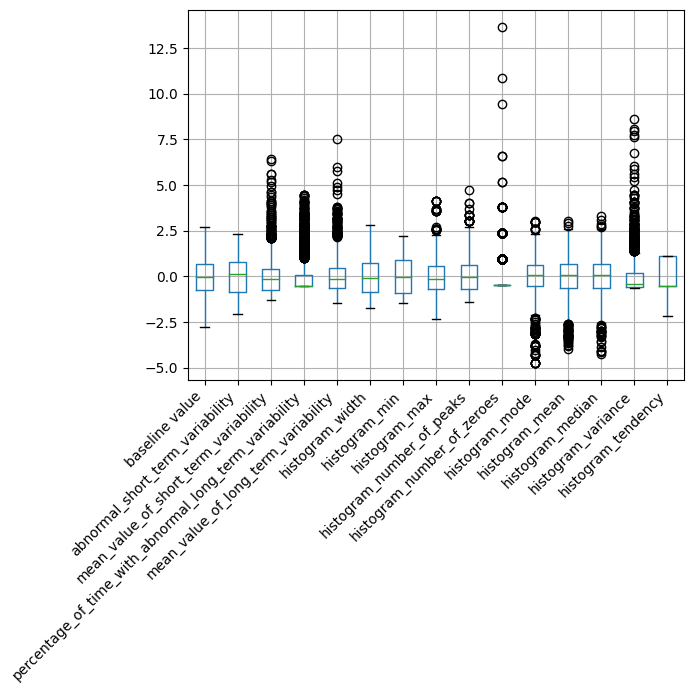

In [28]:
df.boxplot()
plt.xticks(rotation=45, ha='right')
plt.show()

The boxplot of the normalized dataset is more interpretable because it allows an easier comparison between variables: from the boxplot above it's possible to detect that the histogram features, mean value of short term variability, % of time with abnormal long term variability and mean value of long term variability contains more outliers instead of other variables and this can lead to a bad clustering behavior. However, also in this case I assumed that outliers are not consequences of human errors but belong to specific behaviour.

For this purpose, four Principal Components has been selected according to both the Kaiser's rule and the cumulative sum of variance explained: the ***Kaiser's rule*** suggests to keep the Principal Components which explain a variance higher than 1, the ***cumulative sum of variance explained*** allows us to visualize the ratio of variance explained, in this case with 4 Principal Components I am able to maintain 75% of variance which is a good compromise. 

In [14]:
pca = PCA(n_components = 4)
result = pca.fit_transform(df)
print("Kaiser's rule: ", pca.explained_variance_)
print("Cumulative sum of variance explained: ", np.cumsum(pca.explained_variance_ratio_))

Kaiser's rule:  [5.27 3.26 1.54 1.18]
Cumulative sum of variance explained:  [0.35 0.57 0.67 0.75]


To understand the meaning of each Principal Component, the loadings, compared to each feature, have been represented as a heatmap: 

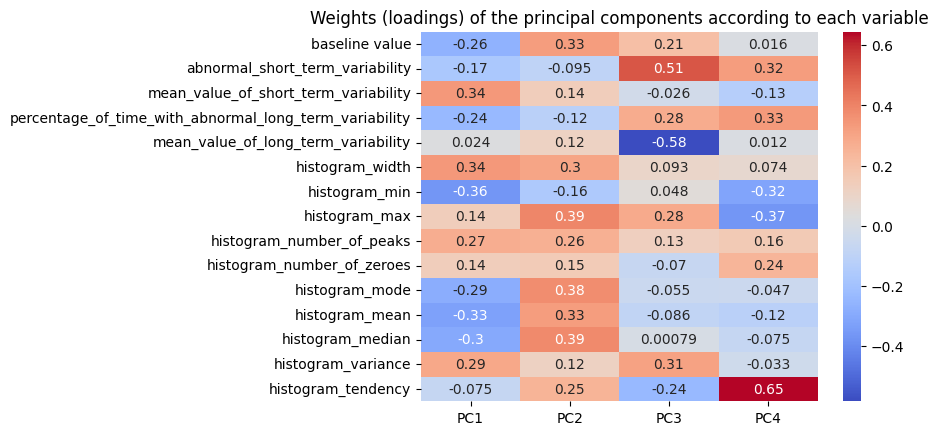

In [15]:
loadings = pd.DataFrame(np.transpose(pca.components_))
loadings.columns = ['PC1', 'PC2', 'PC3', 'PC4']
loadings.index = df.columns
ax = sns.heatmap(loadings, annot=True, cmap='coolwarm')
plt.title('Weights (loadings) of the principal components according to each variable')
plt.show()

The heatmap below can be resumed as follow: 
* **PC1** is able to represents mean value of short term variability, histogram width, histogram number of peaks and histogram variance. 
* **PC2** is able to represents baseline values, histogram max, histogram mode, mean and median.
* **PC3** is able to represents abnormal short term variability and histogram variance.
* **PC4** is able to represents histogram tendency,, histogram number of zeroesand % of time with abnormal short term variability

In the table below we can see the scores, which represent the observations projected in the orthogonal space, plotted in the pairplot below and coloured by the ground truth for a comparison purpose:

In [16]:
scores = pd.DataFrame(result)
scores.columns = ['PC1', 'PC2', 'PC3', 'PC4']
scores['target'] = y.reset_index().iloc[:,-1]
scores.head()

,PC1,PC2,PC3,PC4,target
0,0.169757,-2.321112,1.263471,2.853563,2.0
1,2.001870,2.009072,-0.646743,-1.183584,1.0
2,1.977828,1.950506,-0.994339,-1.231758,1.0
3,2.314957,2.181897,-2.481595,0.516509,1.0
4,2.087153,1.933677,-2.321376,0.380564,1.0


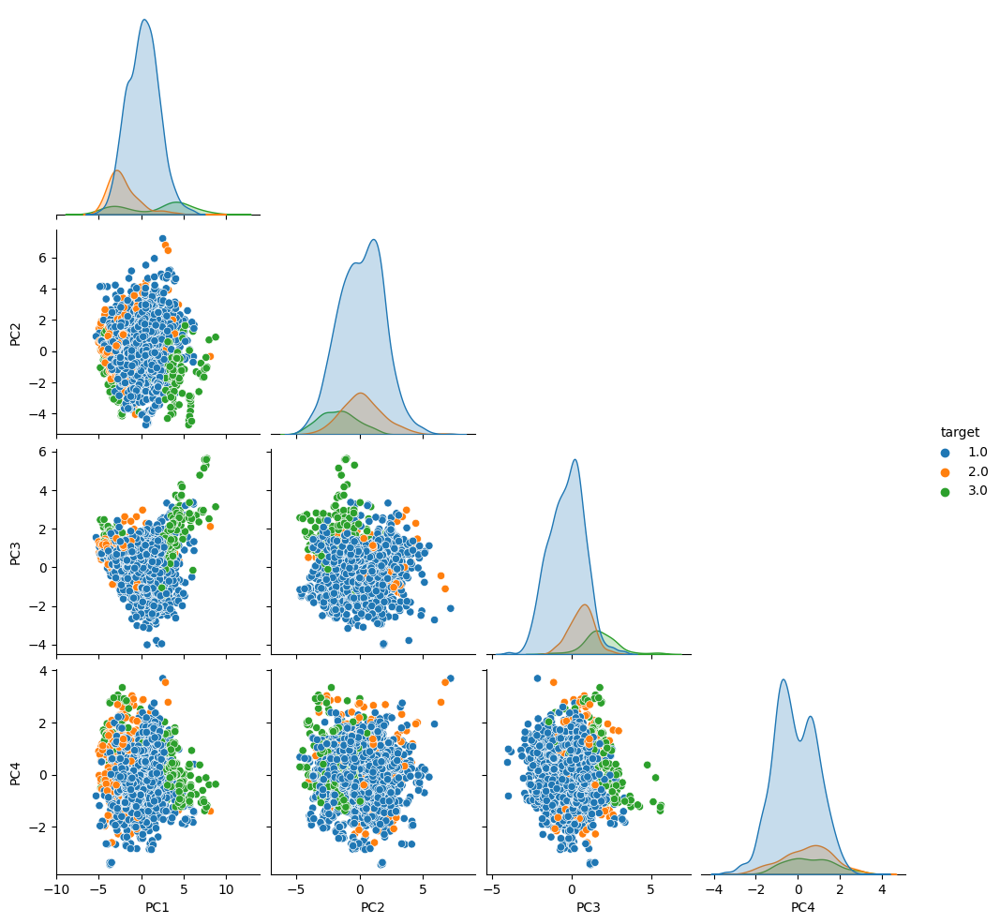

In [45]:
sns.pairplot(scores, hue='target', diag_kind='kde', corner=True)

The ground truth has been considered for a comparison purpose only, as the unsupervised machine learning doesn't take into account the ground truth. \
In the scatterplot above, blue cluster represents normal fetal health, orange cluster represents suspect fetal health and red cluster represents pathological fetal health. At a first view, I can detect that the red cluster is the best distinguishable cluster in almost all the plots. 

### Clustering
<a id="22"></a>

The clustering algorithm allows to identify clustering behaviour among the observations without taking into consideration the ground truth. This algorithm can be very useful in real life in those case when the label is not provided, however, it can be difficult to interprete the meaning of each cluster in those cases where expert domain is required. \
During the analysis, different types of clustering algorithm has been implemented on the PCA and imbalanced dataset to better simulate real life (as in real-life problems, SMOTE algorithm can't be implemented because of the missing ground truth): distance-based clustering algorithms, density-based clustering algorithms and hierarchical clustering algorithms. For each algorithm, the **Silhouette score** has been computed in order to tune the hyperparameter to obtain the best internal measure. \
Finally, since the ground truth is known and after evaluating the results, I realized that a comparison with the ground truth thanks to the **Adjusted Rand Index (ARI)** was strictly necessary in order to provide a better interpretation of the results, because of the missing domain knowledge.

#### K-means 
<a id="23"></a>

The objective of the K-Means clustering algorithm is to minimize the WSS (within clusters sum of square) and maximize the BSS (betqeen clusters sum of squares). Each cluster is represented by the mean of the observations which it contains. The algorithm starts with k random centroids and the observations are assigned to the nearest centroid using Euclidean distance to form initial clusters. At this point, the mean of each cluster is recomputed and the observations are reassigned according to the updated mean until convergence is achieved. \
As the number of clusters must be provided by user, the hyperparameter tuning choose the highest internal measure among 16 clusters.

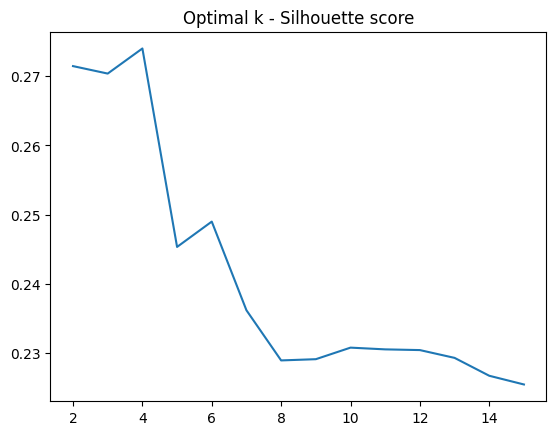

In [18]:
X = scores.iloc[:,:-1]
y = scores.iloc[:,-1]

k_test = range(2, 16, 1)
silhouette_scores = []

for k in k_test:
    kmeans_k = KMeans(n_clusters=k, n_init = 200, random_state=seed)
    kmeans_k.fit(X)
    label_k = kmeans_k.labels_
    score_k = silhouette_score(X, label_k)
    silhouette_scores.append(score_k)
        
sns.lineplot(x=k_test, y=silhouette_scores).set(title='Optimal k - Silhouette score')
plt.show()                

The plot above shows that the highest Silhouette score belongs to 4 clusters, which has been implemented in the code below:

In [47]:
t0 = time()
kmeans = KMeans(n_clusters = 4, n_init = 200, random_state=seed)
kmeans.fit(X)
time_kmeans = time() - t0
print('External measure is: ', adjusted_rand_score(y, kmeans.labels_))

External measure is:  0.06665602771618258


As we can see, the ARI score, which goes from 0 to 1, performes a very low value. This mean that the clustering behavior found with this algorithm is very far from the ground truth. 

In [48]:
kmeans_measures = []
s_kmeans = silhouette_score(X, kmeans.labels_)
adj_rand_kmeans = adjusted_rand_score(y, kmeans.labels_)
kmeans_measures.append(s_kmeans)
kmeans_measures.append(adj_rand_kmeans)
kmeans_measures.append(time_kmeans)

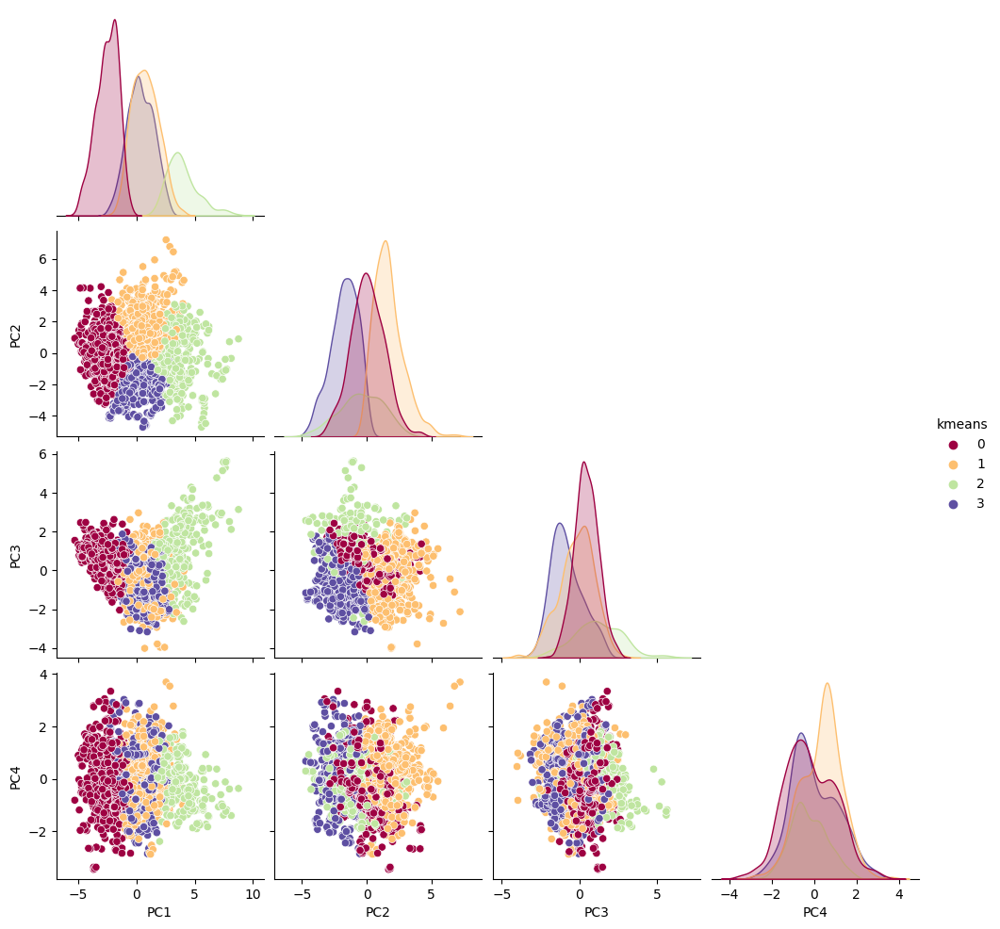

In [49]:
X['kmeans'] = kmeans.labels_.astype('int')
sns.pairplot(X, hue='kmeans', corner=True, palette = 'Spectral')
plt.show()
X = X.drop(columns =['kmeans'])

The scatterplot above shows that the clusters are very well distinguishable in almost all of the pairwise features. In particular, violet cluster seems to be the best cluster.

#### Agglomerative clustering
<a id="25"></a>

The hierarchical clustering recursively merges pair of clusters of sample data by using linkage distance. The most important parameters in this clustering algorithm are the linkage method and the type of distance. For this reason, before computing the optimal number of clusters, I computer the internal measures of all the combinations in order to discover the best combination between metrics and linkage method: 

In [50]:
agglomerative = AgglomerativeClustering(metric = 'euclidean', linkage = 'ward').fit(X)
print('Internal measure with Euclidean-Ward: ', silhouette_score(X, agglomerative.labels_))
agglomerative = AgglomerativeClustering(metric = 'euclidean', linkage = 'complete').fit(X)
print('Internal measure with Euclidean-Complete: ', silhouette_score(X, agglomerative.labels_))
agglomerative = AgglomerativeClustering(metric = 'euclidean', linkage = 'average').fit(X)
print('Internal measure with Euclidean-Average: ', silhouette_score(X, agglomerative.labels_))
agglomerative = AgglomerativeClustering(metric = 'euclidean', linkage = 'single').fit(X)
print('Internal measure with Euclidean-Single: ', silhouette_score(X, agglomerative.labels_))

agglomerative = AgglomerativeClustering(metric = 'manhattan', linkage = 'complete').fit(X)
print('Internal measure with Manhattan-Complete: ', silhouette_score(X, agglomerative.labels_))
agglomerative = AgglomerativeClustering(metric = 'manhattan', linkage = 'average').fit(X)
print('Internal measure with Manhattan-Average: ', silhouette_score(X, agglomerative.labels_))
agglomerative = AgglomerativeClustering(metric = 'manhattan', linkage = 'single').fit(X)
print('Internal measure with Manhattan-Single: ', silhouette_score(X, agglomerative.labels_))

agglomerative = AgglomerativeClustering(metric = 'cosine', linkage = 'complete').fit(X)
print('Internal measure with Cosine-Complete: ', silhouette_score(X, agglomerative.labels_))
agglomerative = AgglomerativeClustering(metric = 'cosine', linkage = 'average').fit(X)
print('Internal measure with Cosine-Average: ', silhouette_score(X, agglomerative.labels_))
agglomerative = AgglomerativeClustering(metric = 'cosine', linkage = 'single').fit(X)
print('Internal measure with Cosine-Single: ', silhouette_score(X, agglomerative.labels_))

agglomerative = AgglomerativeClustering(metric = 'l1', linkage = 'complete').fit(X)
print('Internal measure with L1-Complete: ', silhouette_score(X, agglomerative.labels_))
agglomerative = AgglomerativeClustering(metric = 'l1', linkage = 'average').fit(X)
print('Internal measure with L1-Average: ', silhouette_score(X, agglomerative.labels_))
agglomerative = AgglomerativeClustering(metric = 'l1', linkage = 'single').fit(X)
print('Internal measure with L1-Single: ', silhouette_score(X, agglomerative.labels_))

agglomerative = AgglomerativeClustering(metric = 'l2', linkage = 'complete').fit(X)
print('Internal measure with L2-Complete: ', silhouette_score(X, agglomerative.labels_))
agglomerative = AgglomerativeClustering(metric = 'l2', linkage = 'average').fit(X)
print('Internal measure with L2-Average: ', silhouette_score(X, agglomerative.labels_))
agglomerative = AgglomerativeClustering(metric = 'l2', linkage = 'single').fit(X)
print('Internal measure with L2-Single: ', silhouette_score(X, agglomerative.labels_))

Internal measure with Euclidean-Ward:  0.23333450749169632
Internal measure with Euclidean-Complete:  0.18737920838514732
Internal measure with Euclidean-Average:  0.45292627900821025
Internal measure with Euclidean-Single:  0.46514808142705955
Internal measure with Manhattan-Complete:  0.288237779348176
Internal measure with Manhattan-Average:  0.3968398335521622
Internal measure with Manhattan-Single:  0.48250396377899857
Internal measure with Cosine-Complete:  0.21102092718888366
Internal measure with Cosine-Average:  0.2516331324169593
Internal measure with Cosine-Single:  -0.22062952330264363
Internal measure with L1-Complete:  0.288237779348176
Internal measure with L1-Average:  0.3968398335521622
Internal measure with L1-Single:  0.48250396377899857
Internal measure with L2-Complete:  0.18737920838514732
Internal measure with L2-Average:  0.45292627900821025
Internal measure with L2-Single:  0.46514808142705955


As we can see, Manhattan and Single linkage method provides the highest internal measures, for this reason, in the code above I computed the optimal number of clusters due to the previous results:

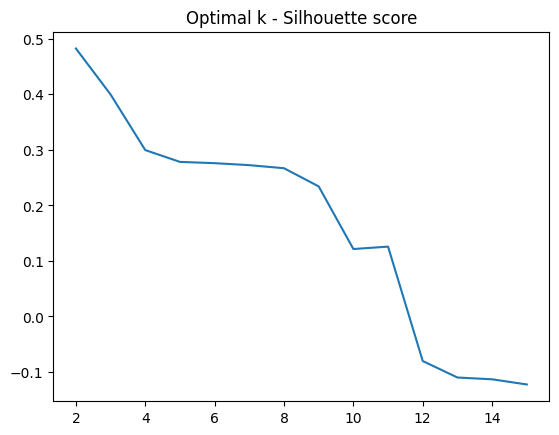

In [51]:
k_test = range(2, 16, 1)
silhouette_scores = []

for k in k_test:
    aggl_k = AgglomerativeClustering(n_clusters=k, metric = 'manhattan', linkage = 'single')
    aggl_k.fit(X)
    label_k = aggl_k.labels_
    score_k = silhouette_score(X, label_k)
    silhouette_scores.append(score_k)
        
sns.lineplot(x=k_test, y=silhouette_scores).set(title='Optimal k - Silhouette score')
plt.show()   

The plot above shows that, with two clusters I am able to maximize the internal measure.

In [52]:
t0 = time()
agglomerative = AgglomerativeClustering(n_clusters=2, metric = 'manhattan', linkage = 'single').fit(X)
aggl_time = time() - t0
print('External measure is: ', adjusted_rand_score(y, agglomerative.labels_))

External measure is:  0.004345866343000768


Also in this case, the clustering algorithm performed very bad compared with the ground truth and this means that it was not able to detect the ground truth behaviour. 

In [53]:
aggl_measures = []
s_aggl = silhouette_score(X, agglomerative.labels_)
adj_rand_aggl = adjusted_rand_score(y, agglomerative.labels_)
aggl_measures.append(s_aggl)
aggl_measures.append(adj_rand_aggl)
aggl_measures.append(aggl_time)

The correct way to visualize the agglomerative clustering is the dendrogram which is represented as a tree, the height of branches represents the distance between clusters and, as a consequences, the best clustered samples.

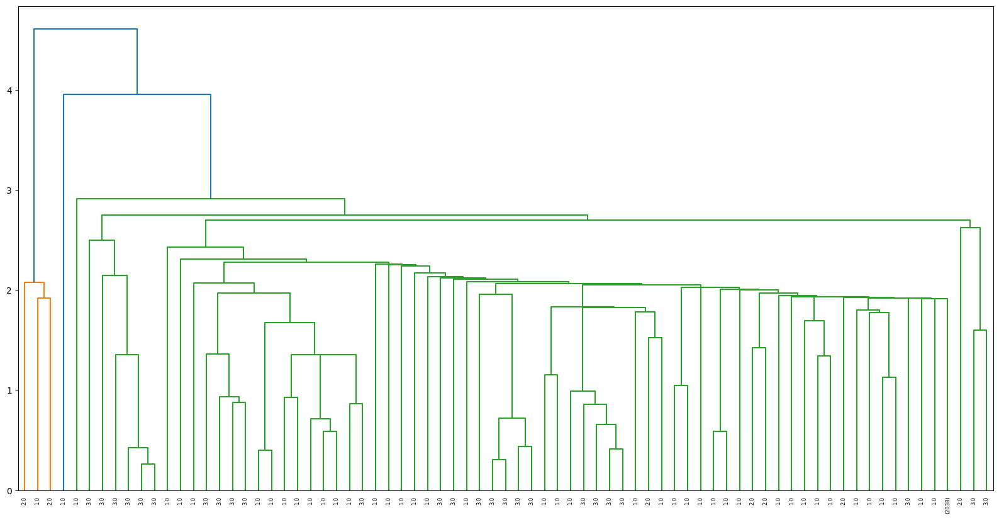

In [54]:
ytdist = np.array(X)
Z = hierarchy.linkage(ytdist, method = 'single', metric = 'cityblock')
plt.figure(figsize = (20,10))
dn = hierarchy.dendrogram(Z, truncate_mode = 'level', labels = np.array(y))

In the dendrogram above, the observations are not equally distributed between clusters as the green cluster contains the majority of the observations belonging to normal and pathological class, the blue cluster contains normal observations and the orange cluster contains normal and suspect observations. For this reason, I can detect that this algorithm can distinguish quite well the difference betqeen suspect and pathological and, bumber of three clusters have the highest value of distance between them. 

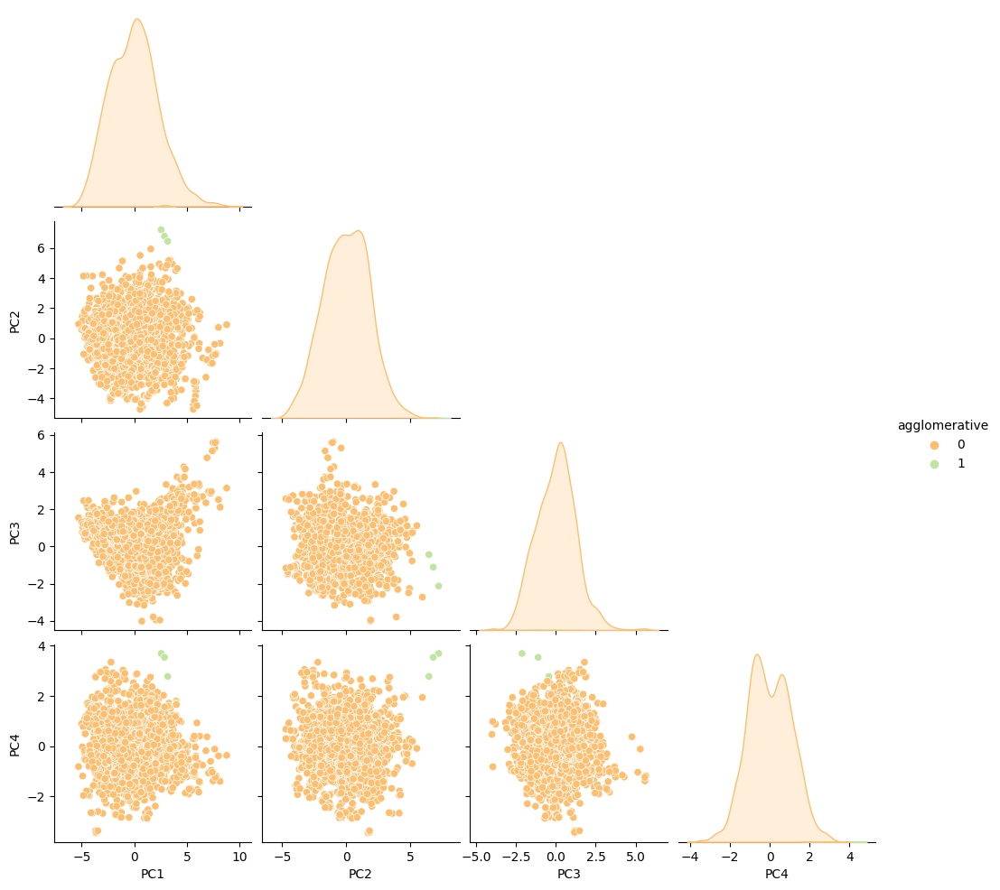

In [55]:
X['agglomerative'] = agglomerative.labels_.astype(int)
sns.pairplot(X, hue='agglomerative', corner=True, palette='Spectral')
plt.show()
X = X.drop(columns =['agglomerative'])

As we can see from the plot above, even if the internal measure performes quite good, the clustering algorithm are not so informative as the green cluster contains only a few number of samples, identifyied as outliers; the orange cluster contains the whole observations instead.

#### Affinity Propagation
<a id="36"></a>

This algorithm chooses the number of clusters according to the data provided and for this reason the optimal k doesn't represent an hyperparameter. The clusters are computed by sending messages between pairs of observations regarding the suitability of one sample to be similar to another sample, until convergence is reached. \
In this case, the most important hyperparameter are the **damping factor** which controls the responsibility and availability message in order to avoid numerical oscillations when update messages, and the **preference** which controls how many exemplars are used. 

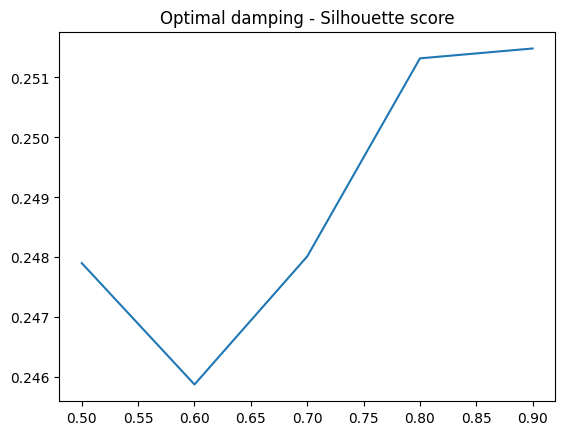

In [19]:
d = [0.5, 0.6, 0.7, 0.8, 0.9]
silhouette_scores = []

for x in d:
    ap_k = AffinityPropagation(damping = x, random_state=seed)
    ap_k.fit(X)
    label_k = ap_k.labels_
    score_k = silhouette_score(X, label_k)
    silhouette_scores.append(score_k)
        
sns.lineplot(x= d, y=silhouette_scores).set(title='Optimal damping - Silhouette score')
plt.show()  

As we can see, I can reach the maximum Silhouette score by using a damping factor of 0.9. Based on this result, in the code below I also computed the optimal preference hyperparameter:

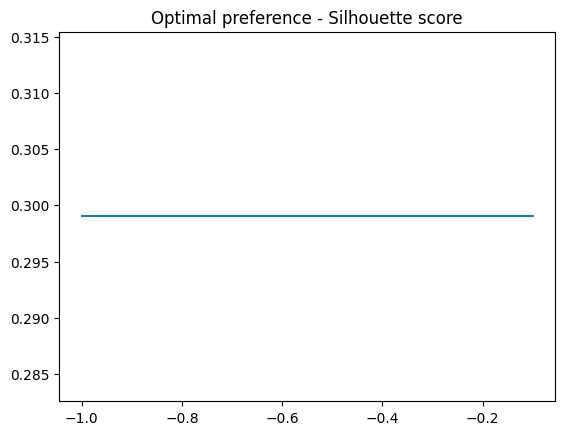

In [57]:
p = [-0.1, -0.2, -0.3, -0.4, -0.5, -0.6, -0.7, -0.8, -0.9, -1.0]
silhouette_scores = []

for x in p:
    ap_k = AffinityPropagation(damping = 0.9, preference = p, random_state=seed)
    ap_k.fit(X)
    label_k = ap_k.labels_
    score_k = silhouette_score(X, label_k)
    silhouette_scores.append(score_k)
        
sns.lineplot(x= p, y=silhouette_scores).set(title='Optimal preference - Silhouette score')
plt.show()  

As we can see, preference from -0.2 to -1 is able to further increase the Silhouette score, for this reason I set the preference as -0.6.

In [26]:
t0 = time()
ap = AffinityPropagation(damping =0.9, preference = -180, random_state=seed).fit(X)
ap_time = time() - t0
print('External measure is: ', adjusted_rand_score(y, ap.labels_))

External measure is:  0.02873906752466372


However, the ARI score doesn't perform very good according to this parameter as its value is 0.001 out of 1.

In [59]:
ap_measures = []
s_ap = silhouette_score(X, ap.labels_)
adj_rand_ap = adjusted_rand_score(y, ap.labels_)
ap_measures.append(s_ap)
ap_measures.append(adj_rand_ap)
ap_measures.append(ap_time)

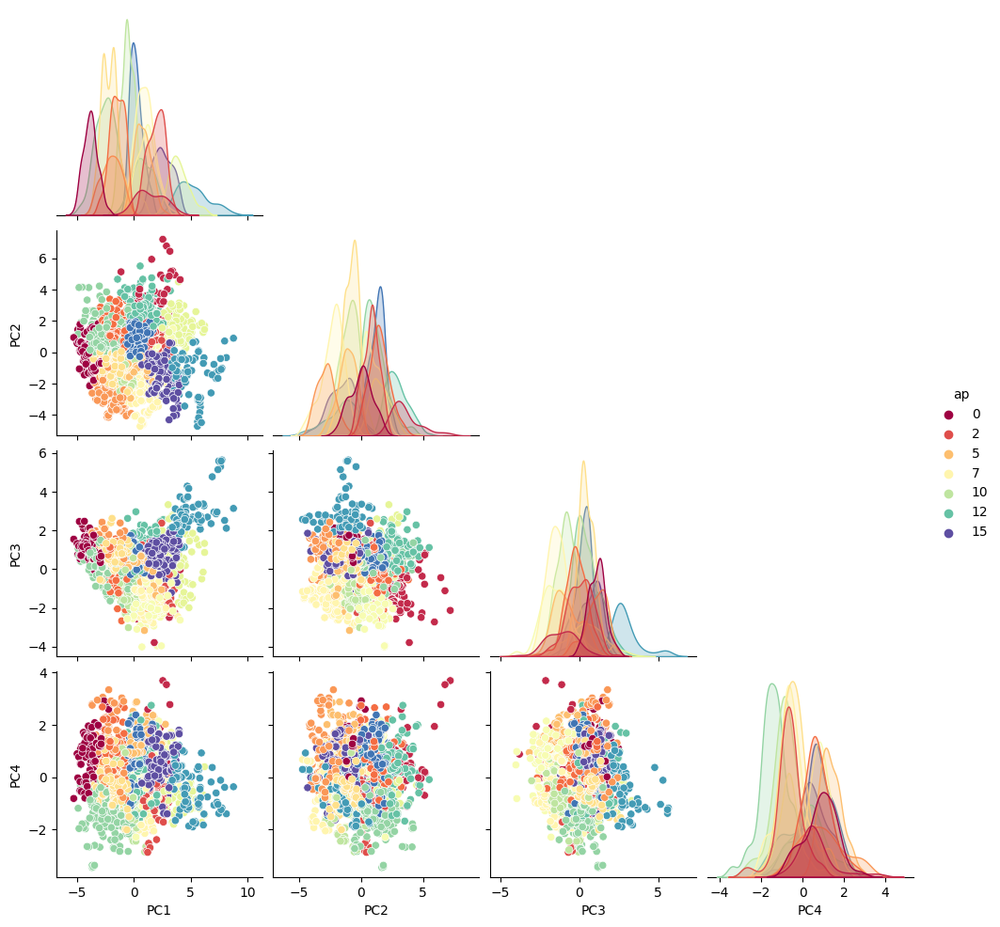

In [27]:
X['ap'] = ap.labels_.astype(int)
sns.pairplot(X, hue='ap', corner=True, palette='Spectral')
plt.show()
X = X.drop(columns =['ap'])

As we can see, this algorithm performed about 600 clusters. This results is very difficult to interpretes and is also very low informative. For this reason, I assume that Affinity Propagation algorithm is not able to interpretes the clustering behaviour of my dataset. 

#### Spectral
<a id="37"></a>

Spectral cluster algorithm performs a low-dimention embedding between samples followed by a clustering algorithm. As this algorithm requires that the user specify the number of cluster, also in this case I computed the internal score for clusters from 2 to 16:

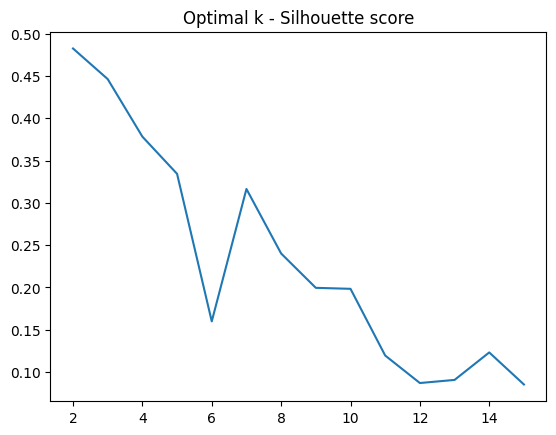

In [61]:
k_test = range(2, 16, 1)
silhouette_scores = []

for x in k_test:
    sp_k = SpectralClustering(n_clusters = x, random_state = seed)
    sp_k.fit(X)
    label_k = sp_k.labels_
    score_k = silhouette_score(X, label_k)
    silhouette_scores.append(score_k)
        
sns.lineplot(x = k, y = silhouette_scores).set(title='Optimal k - Silhouette score')
plt.show()  

The maximum internal score corresponds to 2 clusters. In addition, I decided to choose the optimal kernel that allows me to further maximize the internal score and the corresponding hyperparameter (gamma for the radial basis function and the number of neighbors for the nearest neighbors kernel):

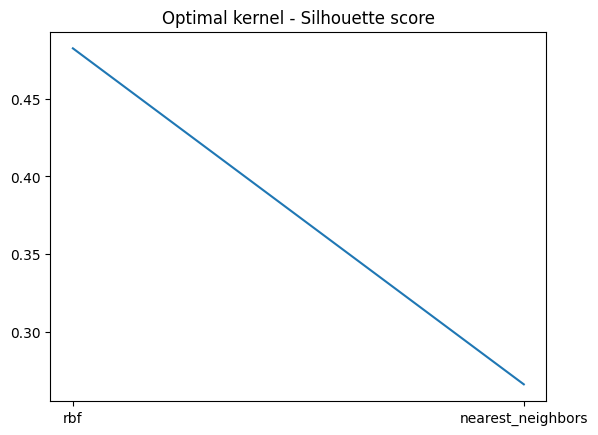

In [62]:
kernel = ['rbf', 'nearest_neighbors']
silhouette_scores = []

for k in kernel:
    sp_k = SpectralClustering(n_clusters = 2, affinity = k, random_state = seed)
    sp_k.fit(X)
    label_k = sp_k.labels_
    score_k = silhouette_score(X, label_k)
    silhouette_scores.append(score_k)
        
sns.lineplot(x = kernel, y = silhouette_scores).set(title='Optimal kernel - Silhouette score')
plt.show()  

The optimal kernel is clearly the Radial Basis Function, so the final optimal algorithm will be composed by the RBF kernel and 2 clusters:

In [63]:
t0 = time()
sp = SpectralClustering(n_clusters = 2, gamma = 0.1, random_state = seed).fit(X)
sp_time = time() - t0
print('External measure is: ', adjusted_rand_score(y, sp.labels_))

External measure is:  0.17491755590158306


In this case, also the external score appears to be slightly better than the other algorithm. \
Below we can see the scatterplot of the projected observations coloured by clusters:

In [64]:
sp_measures = []
s_sp = silhouette_score(X, sp.labels_)
adj_rand_sp = adjusted_rand_score(y, sp.labels_)
sp_measures.append(s_sp)
sp_measures.append(adj_rand_sp)
sp_measures.append(sp_time)

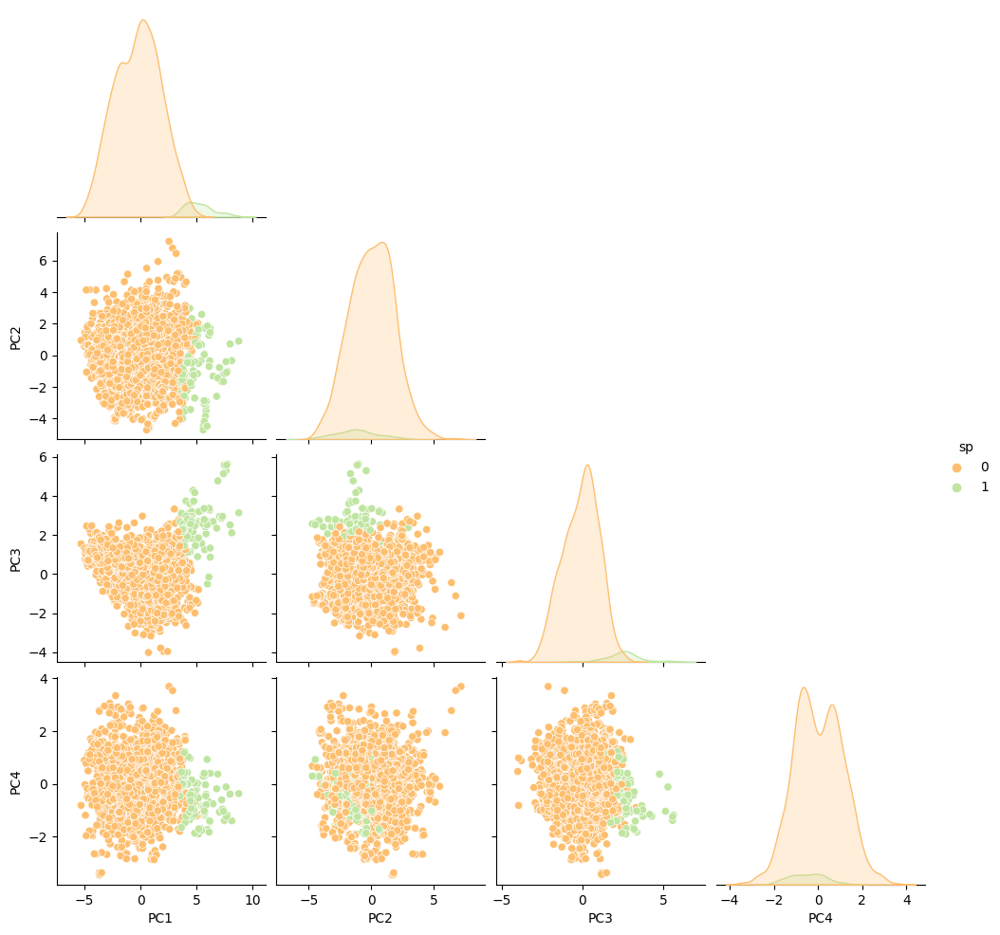

In [65]:
X['sp'] = sp.labels_.astype(int)
sns.pairplot(X, hue='sp', corner=True, palette='Spectral')
plt.show()
X = X.drop(columns =['sp'])

As we can see from the plot above, the orange cluster contains the majority of the observations and the green cluster seems to be able to detect some specific behaviour of the observations. Some further analysis and comparison will be made later on during the model evaluation. 

#### DBSCAN
<a id="30"></a>

DBSCAN stands for Density-Based Clustering of Application with Noise and it finds core samples in region with high density and expands a cluster for each of them. It automatically computes the number of clusters and the most important hyperparameter is the epsilon value, which is the distance to be considered for neighbors to belong to the cluster of the core sample:

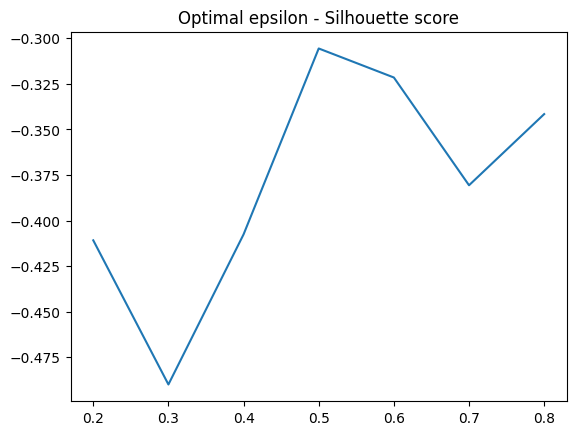

In [66]:
e = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]
silhouette_scores = []

for x in e:
    db_k = DBSCAN(eps = x )
    db_k.fit(X)
    label_k = db_k.labels_
    score_k = silhouette_score(X, label_k)
    silhouette_scores.append(score_k)
        
sns.lineplot(x= e, y=silhouette_scores).set(title='Optimal epsilon - Silhouette score')
plt.show()  

As we can see from the plot above, in each of the epsilon values the internal measures is a negative value, this means that the samples are completely randomly assigned. However, the most performant value is 0.5.

In [67]:
t0 = time()
db = DBSCAN(eps = 0.5).fit(X)
db_time = time() - t0
print('External measure is: ', adjusted_rand_score(y, db.labels_))

External measure is:  -0.056674370619488525


As a consequence, also the external measure is a negative value, this means that the algorithm perform a completely different behaviour compared to the ground truth. 

In [68]:
db_measures = []
s_db = silhouette_score(X, db.labels_)
adj_rand_db = adjusted_rand_score(y, db.labels_)
db_measures.append(s_db)
db_measures.append(adj_rand_db)
db_measures.append(db_time)

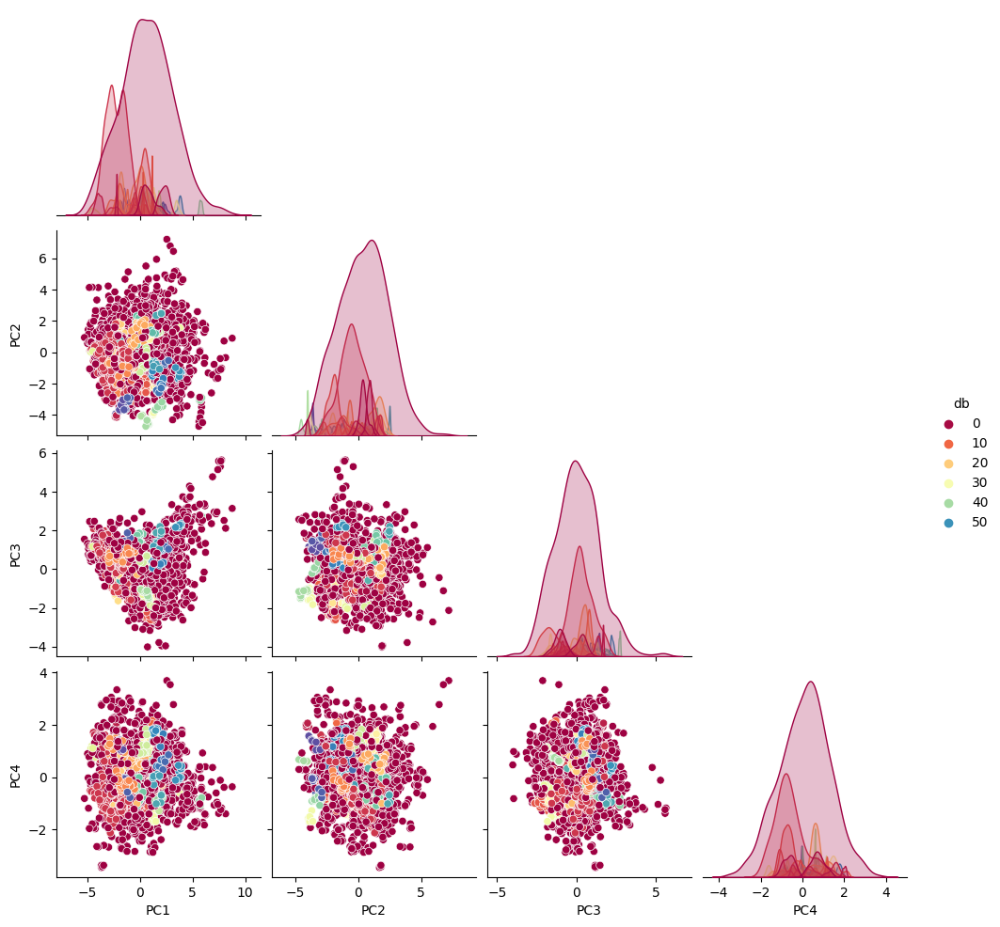

In [69]:
X['db'] = db.labels_.astype(int)
sns.pairplot(X, hue='db', corner=True, palette='Spectral')
plt.show()
X = X.drop(columns =['db'])

As we can see from the scatterplot above, also in this case, like in the Affinity Propagation algorithm, theere are too many clusters and the algorithm appears to be less informative. In addition, the behaviour is completely different compared to the greound truth and the clusters are not well separated.

### Model Selection
<a id="31"></a>

The list builded during the report was collected into a dataframe in order to compare external, internal measures and the executed time for each algorithm:

In [70]:
measures = pd.DataFrame(list(zip(kmeans_measures, aggl_measures, ap_measures, sp_measures, db_measures)),
                        columns =['K-Means', 'Agglomerative', 'Affinity Propagation', 'Spectral Clustering', 'DBSCAN'],
                       index =['Silhouette Score', 'Adjusted Rand Score', 'Time'])
measures

,K-Means,Agglomerative,Affinity Propagation,Spectral Clustering,DBSCAN
Silhouette Score,0.274011,0.482504,0.311539,0.401270,-0.305584
Adjusted Rand Score,0.066656,0.004346,0.001362,0.174918,-0.056674
Time,1.458519,0.036163,12.997130,0.754703,0.030095


As a tradeoff between internal, external measures and time, I selected the Spectral clustering method as the optimal one. \
Below I performed a comparison between observations throw the confusion matrix: 

In [71]:
X['clusters'] = sp.labels_.astype('int')
X['ground_truth'] = y

In [72]:
confusion_matrix = pd.crosstab(X.iloc[:,-1], X.iloc[:,-2], rownames=['True'], colnames=['Clusters'])
print(confusion_matrix)

Clusters     0   1
True              
1.0       1628  18
2.0        290   2
3.0        106  68


According to the results obtained, I decided to compare the clustering with the ground truth as, in order to obtain more accurate interpretation, some knowledge domain is strictly necessary. \
The Spectral clustering performed better with 2 clusters. Compared to the ground truth, I can say that the **cluster 0** is able to identify *normal and suspect* fetal health status, **cluster 1** is able to identify some *pathological* fetal health status. As a final consideration, I can say that the clustering depicted a less detailed behavior of the dataset, as throw the clustering algorithm it's only possible to detect pathological foetus but not suspect fetal health status as the supervised algorithm. 

## Semi-Supervised Machine Learning
<a id="32"></a>

The Semi-Supervised algorithm is a very useful technique used in real life as, usually, the knowledge of the ground truth is not very exhaustive and there's the need to apply an inductive procedure in order to predict the label from a very low percentage of ground truth. \
As the original dataset contains the whole labels for all the observations, as a data preprocessing I assign a different value to 80% of the labels, which the algorithm will read as a missing value. \
In this report, the label propagation and label spreading was performed: the latter was perforemed with a K-Nearest Neighbors kernel by tuning the k parameter, and former was performed with the Radial Basis Function kernel by tuning the gamma parameter. \
Finally, the confusion matrix between true and predicted labels and the classification label allows me to evaluate the best model. 

In [37]:
rng = np.random.RandomState(seed)
random_unlabeled_points = rng.rand(len(data.fetal_health)) < 0.8
labels = np.copy(data.fetal_health)
labels[random_unlabeled_points] = -1

In [38]:
print('Target Value Distribution:')
unique, counts = np.unique(labels, return_counts=True)
print(dict(zip(unique, counts)))

Target Value Distribution:
{-1.0: 1675, 1.0: 345, 2.0: 59, 3.0: 33}


As we can see, the final dataset contains 1675 unlabeled observations, depicted with -1 value.

In [39]:
sc = StandardScaler()
x = sc.fit_transform(data.iloc[:,:-1])

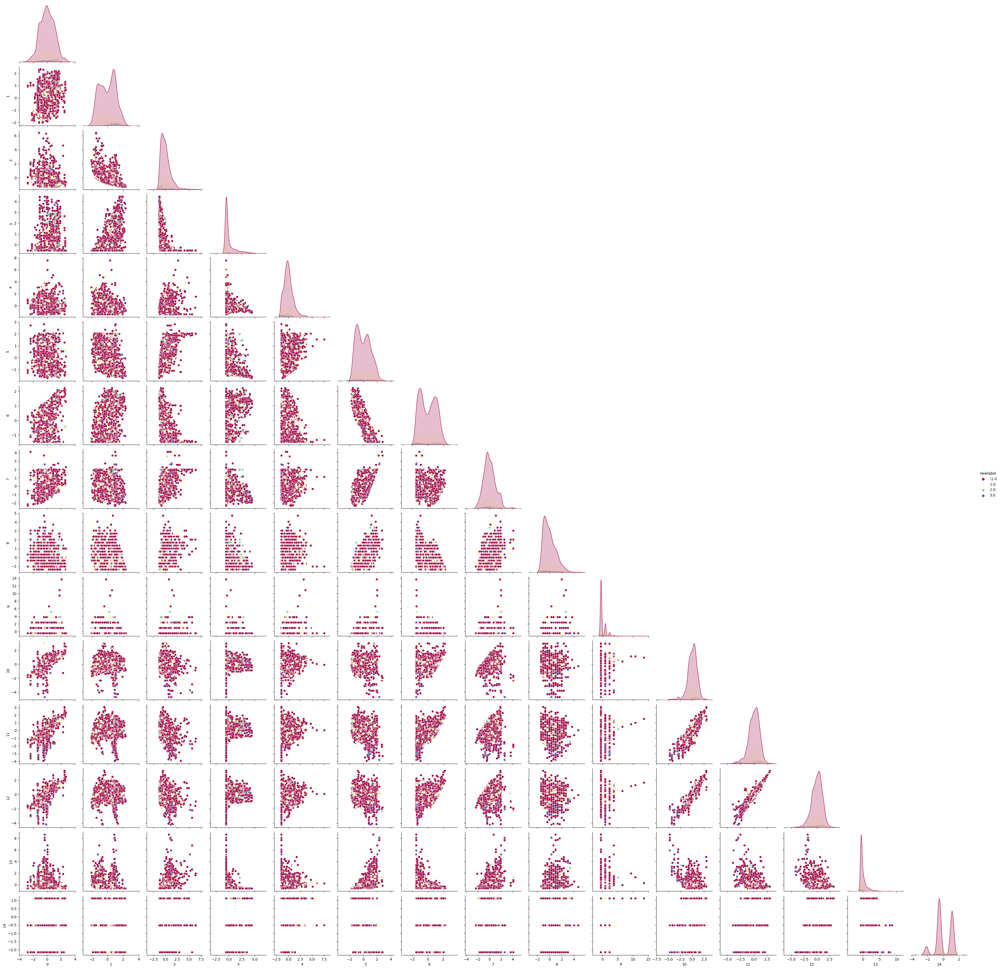

In [40]:
x = pd.DataFrame(x)
x['newlabel'] = labels
sns.pairplot(x, hue='newlabel', corner=True, palette = 'Spectral')
x = x.drop(columns =['newlabel'])

The scatterplot above represents the standardized imbalanced dataset coloured by classes: here, purple coloured group corresponds to unlabeled datapoint.

### Label Propagation
<a id="33"></a>

This algorithm uses the raw similarity matrix constructed from the data with no modifications to propagate the labels. \
As mentioned above, the label propagation algorithm has been trained with k-nearest neighbors as kernel function and the number of neighbors has been left as default. 

In [44]:
LP = LabelPropagation(kernel = 'knn')
LP.fit(x, labels)

LabelPropagation(kernel='knn')

In [45]:
print("Model Name: ", str(LP))
print("Classes: ", LP.classes_)
print("No. of features: ", LP.n_features_in_)
print("No. of iterations: ", LP.n_iter_)
print('')
print('')
print('*************** Evaluation of LP model ***************')
print(classification_report(data.iloc[:,-1], LP.transduction_))

Model Name:  LabelPropagation(kernel='knn')
Classes:  [1. 2. 3.]
No. of features:  15
No. of iterations:  274


*************** Evaluation of LP model ***************
              precision    recall  f1-score   support

         1.0       0.89      0.98      0.93      1646
         2.0       0.73      0.52      0.61       292
         3.0       0.90      0.57      0.70       174

    accuracy                           0.88      2112
   macro avg       0.84      0.69      0.75      2112
weighted avg       0.87      0.88      0.87      2112



This algorithm propagate three classes according to 15 features and reached convergence after 274 iterations. As we can see from the classification report, the algorithm produces 88% of accuracy and the best predicted class was "normal", followed by "pathological" and "suspect".

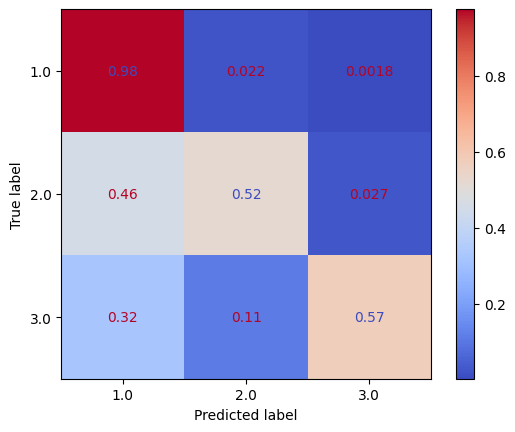

In [46]:
ConfusionMatrixDisplay.from_predictions(data.iloc[:,-1], LP.transduction_, cmap = 'coolwarm', normalize = 'true')
plt.show()

The confusion matrix shows the comparison between the predicted labels and ground truth. From the confusion matrix it's possible to detect type-II error: 46% of suspect foetus and 32% of pathological foetus was predicted as normal, this percentages corresponds to false-negatives and, especially in this field of application, this is a very risky behavior. 

### Label Spreading
<a id="34"></a>

Label Spreading differs from the previous algorithm because it minimizes a loss function that has regularization properties. The code below allows to train the model with the Radial Basis kernel and the default gamma value.

In [47]:
LS = LabelSpreading(kernel = 'rbf')
LS.fit(x, labels)

LabelSpreading()

In [48]:
print("Model Name: ", str(LS))
print("Classes: ", LS.classes_)
print("No. of features: ", LS.n_features_in_)
print("No. of iterations: ", LS.n_iter_)
print('')
print('*************** Evaluation of LS model ***************')
print(classification_report(data.iloc[:,-1], LS.transduction_))

Model Name:  LabelSpreading()
Classes:  [1. 2. 3.]
No. of features:  15
No. of iterations:  8

*************** Evaluation of LS model ***************
              precision    recall  f1-score   support

         1.0       0.91      0.95      0.93      1646
         2.0       0.64      0.61      0.63       292
         3.0       0.86      0.63      0.72       174

    accuracy                           0.88      2112
   macro avg       0.80      0.73      0.76      2112
weighted avg       0.87      0.88      0.87      2112



As we can see from the classification report above, the algorithm reached convergence after 8 iterations and reached an accuracy of 88%. However, suspect and pathological classes performed a better F1 score than the previous model.

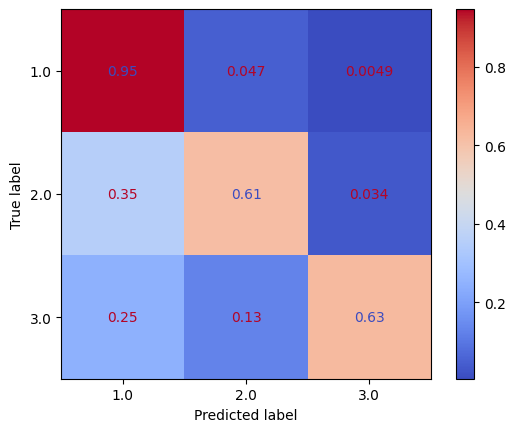

In [49]:
prediction2 = LS.predict(x)
ConfusionMatrixDisplay.from_predictions(data.iloc[:,-1], LS.transduction_, cmap = 'coolwarm', normalize = 'true')
plt.show()

The confusion matrix above, comparing ground truth and predicted labels, allows me to confirm that the overall behaviour of this last model is slightly better than the previous model. However, this is not enough as the false-negatives belonging to suspect class are 35% and 25% for the pathological class, and this is still a bad result, especially in this field of application. 

***
## Discussion and Conclusion
<a id="35"></a>

* Regarding the supervised learning, I was able to confirm that, in general, **balancing the dataset** allows the model to produce a higher performance and to learn better than the imbalanced dataset. In particular, balancing the dataset allows me to reduce the number of false-negatives in almost all the cases, which is a very good results as predicting as normal a pathological case could be very risky. 
* Regarding the unsupervised learning, the results obtained was very useful compared to the ground truth. In general, I detected a worse behaviour of the density-based approach rather than the distance-based approach. In particular, the **Spectral Clustering** was able to detect some pathological fetal health status. However, in a real-life problem, comparing my results with ostetricians can lead to some further interpretability of clusters.
* The semi-supervised algorithms didn't provide satisfactory results as, even if both models performed 88% of accuracy, by inspecting to some detailed metrics of evaluation, I discovered a risky behavior concerning type-II errors (false-negatives) which is very risky in most general cases. However, comparing both models, **Label spreading** appears to be slightly performant than label propagation.

As this is a datadset coming from Kaggle, I had the chance to compare my analysis with some existing analysis and results. \
In particular, the most relevant analysis regarding this topic was __[Jha S. (2022), Predicting Fetal Health - Gradient Boosting](https://www.kaggle.com/code/surajjha101/predicting-fetal-health-gradient-boost)__ and __[Kapoor K. (2020), Fetal Health Classification](https://www.kaggle.com/code/karnikakapoor/fetal-health-classification)__.

The **first analysis** regards the raw dataset and the author didn't performed any data preprocessing (neither removing low variance features, not removing outliers or duplicate rows not balancing the dataset). After scaling the dataset and splitting into train and test set, some classification algorithm has been applyied: 
* logistic regression (86.47%), 
* decision tree (92.24%), 
* gradient boosting (94.41%), 
* random forest (93.83%) and 
* k-nearest neighbors (88.71%). 

The list below represents my results:

In [136]:
newlist = zip(models, accuracy1, accuracy2)
print('Models, imbalanced accuracy, balanced accuracy')
print(list(newlist))

Models, imbalanced accuracy, balanced accuracy
[('Linear SVC', 0.8827717591698419, 0.8367088607594937), ('Decision Tree', 0.9224430670904079, 0.9179746835443037), ('KNN', 0.9153354520394009, 0.9521518987341773), ('Random Forest', 0.9366547855249066, 0.9524050632911394), ('Gradient Boosting', 0.9319157902129825, 0.9506329113924051)]


As we can see, I performed the analysis on the same dataset for four models out of five: my linear model performed better in the imbalanced dataset, decision tree performed the same on the imbalanced dataset, my knn model performed better on both balanced and imbalanced dataset, my random forest model performed better on the balanced dataset, the same for the gradient boosting. \
After the GridSearch, my knn algorithm performed 95% on "normal" class, 93% on "suspect" class and 97% on "pathological", versus 97% on "normal" class, 86% on "suspect" class and 93% on "pathological" class for the compared gradient boosting. \
From this first comparison I can affirm that the preprocessing step represents a crucial step to empower the algorithms.

Also in the **second analysis**, preprocessing step didn't involved neither outliers removal, not features selection, removing duplicate rows or balancing the target variable. \
The models compared was:
* logistic regression (89.72%), 
* decision tree (91.67%), 
* random forest (94.02%) and 
* support vector classifier (90.66%). 

Compared to my analysis, my decision tree model performed better in both balanced and imbalanced dataset and my random forest model performed better on the balanced dataset (+1%). \
In addition, after the GridSearch, the classification report shows 95% of accuracy on the test set with 97% of accuracy on the "normal" class, 85% of accuracy on the "suspect" class and 90% of accuracy on the "pathological" class. Also in this case, balancing the target variable and performing a data preprocessing was crucial to obtain a higher accuracy rate in predicting the most risky classes.